In [62]:
from IPython.display import HTML

HTML('''<script>
code_show=true;
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
}
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()">
<input type="submit" value="Click here to toggle on/off the raw code.">
</form>''')

In [63]:
HTML("""
<style>
.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}
</style>
""")

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import requests
import json
import praw
import getpass
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.feature_extraction import text
import bisect
from scipy.spatial.distance import euclidean, cityblock
import IPython.display
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image, ImageOps
from os import path
import seaborn as sns
from sklearn.cluster import KMeans
from pyclustering.cluster.kmedians import kmedians
from pyclustering.cluster.kmedoids import kmedoids
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.cluster.hierarchy import fcluster
from sklearn.base import clone
from sklearn.metrics import calinski_harabasz_score, silhouette_score
import plotly.graph_objects as go
import plotly.io as pio
import plotly.express as px
import re

In [2]:
import warnings
warnings.filterwarnings("ignore")


def showwarning(*args, **kwargs):
    if args[1] is DeprecationWarning:
        return
    warnings._showwarning_orig(*args, **kwargs)
warnings.showwarning = showwarning

# His/Her Circumstances: The Hidden Issues Faced by Men and Women

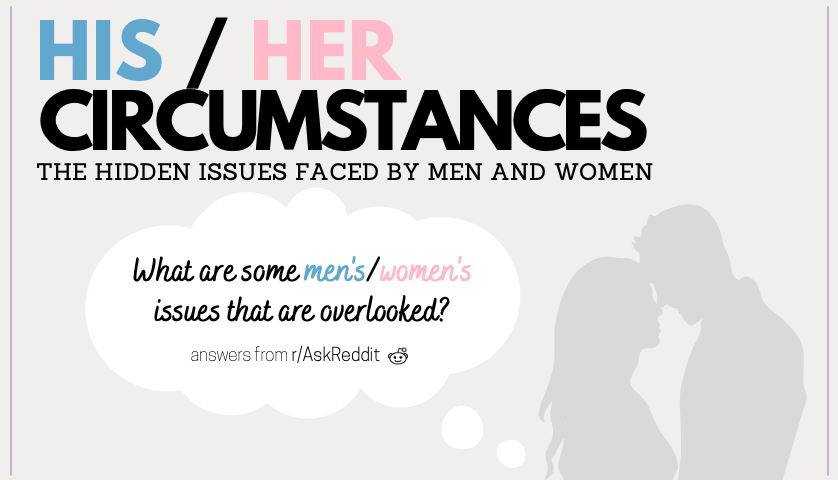

In [3]:
IPython.display.Image(filename='header.png')

## 1 Executive Summary

People are mostly aware of issues unique to their own circumstances. Sometimes, arguments arise between the sexes due to the lack of awareness of the issues the opposite sex faces. To glean insights on these unique issues, this study uses two relatively high traffic and high engagement posts on Reddit, one on men's issues and one on women's issues, mined using Reddit's Application Programming Interface (API). Then, data cleaning and vectorization is done using tokenization and TF-IDF representation. An initial exploratory data analysis is done to visualize the cleaned, yet unclustered and unreduced most frequent words formed from both posts. Dimensionality reduction using Latent Semantic Analysis applies Single Value Decomposition to trim features to a more managable size prior to clustering. With reduced dimensionality containing features that capture more of the variance of the data, different clustering methods are tested to generate the best clustering of this reduced data. The results found that using K-Medians at k=5 produced the best clustering, allowing 5 clusters to each be formed for men and women's issues. Men's issues revolved around poor mental health, being unheard, double standards, and forced circumcision. Women's issues, on the other hand, revolved around medical concerns and reproductive health, and sexual objectification. 

Common issues affecting both sexes are growing concerns about emotional and mental health. Future studies could either: 

1. expand the scope by looking into LGBTQIA+ related issues and the nuances of differing cultures.
2. explore different methodologies such as using deep learning or time series analysis. 
3. deploy qualitative measures such as finding domain experts and running focus group discussions.

## 2 Introduction and Motivation for the Study

More often than not, we are only aware of problems unique to our own situations and experiences, including issues related to our respective genders. Such lack of awareness of these differing circumstances may lead to misunderstanding, conflict, or a hesitation to speak out. 

Fortunately, the Internet has become a resource people turn to for open discussion, and Reddit especially has become a haven for netizens to discuss even uncomfortable topics, whether openly or anonymously. The study seeks to extract and explore posts on r/AskReddit forums about hidden or unspoken issues relating to men and women respectively, to shed understanding on the unique, or perhaps shared, problems that are faced by each gender.

Unveiling hidden issues can bring about understanding and help people develop empathy.  It is hoped that shining a light on these unmet needs can kickstart constructive and open conversations, or even help bring about solutions regarding these important but uncomfortable gender-related topics.

## 3 Problem Statement

This study seeks to answer the following questions:
- What are the unspoken issues that affect women and men, as disclosed by users on Reddit? Which issues are most often cited, and what are the common themes, if any?
- What issues are common to both genders? Which issues are unique to either gender?

## 4 Methodology

The study utilized r/AskReddit subreddit as the primary information source, specifically two threads, respectively titled: “What are some men’s issues that are often overlooked?” and “What are women’s issues that are often overlooked?”  The Reddit API was used for extracting data, and a corpus of top-level comments was compiled for each of these forums, to build datasets of reddit replies relating to men’s and women’s issues.  The datasets were then transformed using Bag-of-words and TF-IDF vectorization, and exploratory data analysis was performed using word clouds and other relevant plots. To allow for quantitative analysis, Latent Semantic Analysis (LSA) was applied as a dimensionality reduction technique to identify key features that better summarize the data.  Clustering techniques and corresponding internal validation metrics were then applied to identify key themes relating to men’s and women’s issues.  Finally, the study analysts used these derived clusters as bases for extracting insights on which issues relate to either gender.

**Figure 1: Summary of Methodology**

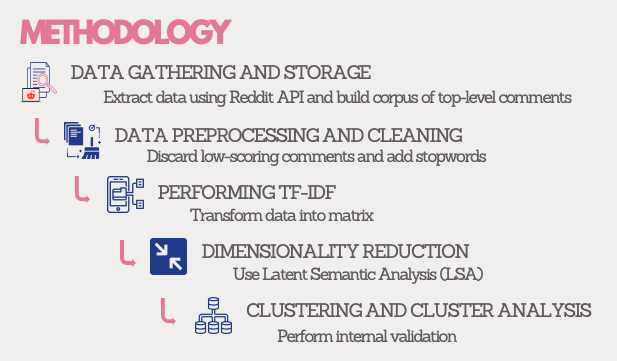

In [4]:
IPython.display.Image(filename='methodology.png')

To outline the steps in further detail:
1. Extract data of top-level comments for the forums "What are some men’s issues that are often overlooked?" and "What are women’s issues that are often overlooked?" using the Reddit API, making use of the `praw` library
2. Build a corpus of the comments, filtering out deleted or removed comments and retaining only those with a score greater than 1
3. Perform Bag-of-words and TF-IDF vectorization on the corpus, adding common pronouns and gendered words to the default English stop words
4. Perform Exploratory Data Analysis on the vectorized datasets using a bar plot comparing the number of comments in each dataset, and word clouds to depict the prominenet words in each dataset
5. Perform Latent Semantic Analysis (LSA) by applying Singular Value Decomposition (SVD) dimensionality reduction on the vectorized data, then identify and describe the top derived features
6. Perform agglomerative clustering using Ward's Method, Single Linkage, Complete Linkages, and Average Linkages, and examine the resulting dendograms and scatter plots for possible useful cluster formation
7. Perform representative clustering using K-Means, K-Medians, and K-Medoids, then perform internal validation and examine the validation plots for useful values for k
8. Select a clustering method and plot the clusters
9. Examine the derived clusters, extracting representative comments for each, to understand the themes behind each cluster and extract insights on which issues are common or unique to either gender

## 5 Data

### 5.1 Data Source

Reddit is an American social news aggregation and discussion website, where members submit content and post comments, which are then voted up or down by other members. The website is organized by topic into user-created boards called "subreddits", each dedicated to a particular area of interest, and the upvotes or downvotes for a particular comment or post affects whether it will be shown near the top or the bottom of the forum. [1]

AskReddit is one of these subreddits, where users can submit questions to which other users can then respond with answers. On the subreddit language page, it describes itself as **"the place to ask and answer questions that elicit thought-provoking discussions"**. [2]

As of July 2015, AskReddit was the most popular subreddit on all of Reddit [3], and as of September 2021, it has 33.5 million members. [4] It has been described in a Complex article as follows: [5]<br><br>
<center>
Reddit bills itself as the front page of the Internet. If one were to extend this metaphor, then AskReddit would be the headline splashed across the top of that front page, because there is nothing as consistently exciting, absorbing, and cringe-worthy as the posts on AskReddit.
</center>
<br>

For this study, comments were extracted from the following r/AskReddit forums:
**"(Serious) What are some men's issues that are overlooked?"**
and
**"(Serious) What are some women's issues that are overlooked?"**

Both forums were created at the same time, in July 2, 2021, meaning that the dataset is quite current and represents top-of-mind concerns about gender-related issues as of the time this report was written in September of 2021.

The forums may be viewed using the following links:
https://www.reddit.com/r/AskReddit/comments/obpas8/serious_what_are_some_mens_issues_that_are/
https://www.reddit.com/r/AskReddit/comments/obxaum/serious_what_are_some_womens_issues_that_are/

### 5.2 Data Retrieval

The first step in the data gathering portion of the study was obtaining access to the Reddit API.  Existing user accounts of the study analysts were leveraged, and access credentials were obtained in the form of a `Reddit User Agent`, a `Reddit Client ID`, and a `Reddit Client Secret`.

In [5]:
# Note to reader:  If viewing this report as a Jupyter notebook,
# if the following code cells were run, the notebook will prompt the user
# to input user credentials.  These credentials must be inputted in sequence
# to allow authenticated access.  User credentials will be masked upon input.

# print('Please enter Reddit User Agent')
# user_agent = getpass.getpass()

# print('Please enter Reddit Client ID')
# client_id = getpass.getpass()

# print('Please enter Reddit Client Secret')
# client_secret = getpass.getpass()

In [6]:
# Reddit Comments Extraction
def reddit_extract(url, ua, cid, cs):
    """Return a dataFrame containing extracted Reddit comments."""

    # Initialize Reddit
    reddit = praw.Reddit(
        user_agent=ua,
        client_id=cid,
        client_secret=cs)

    # Assign submission
    sub = reddit.submission(url=url)
    # Comment Forest with all top-line comments
    sub.comments.replace_more(limit=None)

    # Comment retrieval loop
    comments = pd.DataFrame()
    for i, comm in enumerate(sub.comments):
        # Skip the bot comment
        if i == 0:
            pass
        else:
            comments = comments.append(
                pd.DataFrame(
                    dict(author=comm.author,
                         user_id=comm.id,
                         score=comm.score,
                         comment=comm.body),
                    index=[i]))
    return comments

In [7]:
# The below code is for extracting relevant data from Reddit, however
# the extraction may take several hours.  To avoid lengthy execution
# issues when running this notebook, the output .csv file required by
# succeeding code cells will be provided as accompaniment to this report.

# Men's issues that are overlooked
# df_comm_men = reddit_extract('https://www.reddit.com/r/AskReddit/comments/'
#                              'obpas8/serious_what_are_some_mens_issues_that'
#                              '_are/',
                              #  user_agent,
                              #  client_id,
                              #  client_secret)

# Women's issues that are overlooked
# df_comm_women = reddit_extract('https://www.reddit.com/r/AskReddit/comments/'
#                                'obxaum/serious_what_are_some_womens_issues_'
#                                'that_are/',
#                                user_agent,
#                                client_id,
#                                client_secret)

### 5.3 Data Cleaning and Preparation

#### Cleaning

First, comments that have been deleted or removed by its author were filtered out. These comments only contain the placeholders `[removed]` or `[deleted]` and don't really have any meaningful information.

Also, comments with a score of less than 1 were removed as well. This is to ensure that the the comment received at least 1 upvote, signifying that the comment was not considered irrelevant by all the other forum members.

In [8]:
# Load men and women comments from csv files
men_comments = pd.read_csv('reddit_men.csv')
women_comments = pd.read_csv('reddit_women.csv')
men_orig = men_comments.copy()
women_orig = women_comments.copy()

# Filter out deleted and removed comments
men_comments = men_comments[(men_comments['comment'] != '[deleted]') &
                            (men_comments['comment'] != '[removed]')]
women_comments = women_comments[(women_comments['comment'] != '[deleted]') &
                                (women_comments['comment'] != '[removed]')]

# Only gather comments with score greater than 1. A score that is at least
# greater than 1 means that different users agree to the comment
men_comments = men_comments[men_comments['score'] > 1]
women_comments = women_comments[women_comments['score'] > 1]

all_comments = pd.concat([men_comments, women_comments], axis=0)

#### TF-IDF Representation

The next step was to vectorize the different comments. Prior to vectorization, the data is stored as strings of different length, making it difficult quantify the relative frequencies of the different words. The TfIdfVectorizer module from the sklearn library was used, which essentially performs the following steps:
- converts documents into a Bag-of-words representation, which removes the sequence of the words, but organizes the data based on the frequency of each word in the particular comment
- vectorizes the comments, to ensure that frequencies pertaining to a given word appear on the same column within the matrix
- computes TF-IDF scores, which is proportional to the total frequency of a word within a given coment, and inversely proportional to the number of comments the word appear in, thus reducing the weight of words that appear in numerous documents
- removes stop words and words that appear in too few comments (as they are likely to be noise) or too many documents (as they are likely to hold little meaning)

This was performed on the corpus of comments on women's issues, men's issues, and all the issues combined, allowing subsequent visualizaiton and quantiative analysis to be performed on the datasets.

In [9]:
# Define TF-IDF Vectorizer function
def get_comments(comments):
    """Return the TF-IDF vectorization of Reddit comments."""

    # Define stop words to be used for the vectorizer. Additional
    # words are added on top of the default english stop words
    addtl_stop_words = ["don't", "just", "i'm", "i've",
                        "it's", "you're", "ve", "don", "t",
                        "man", "men", "woman", "women",
                        "male", "female", "like"]
    word_filter = text.ENGLISH_STOP_WORDS.union(addtl_stop_words)

    # Perform TF-IDF vectorization
    tfidf_vectorizer = TfidfVectorizer(token_pattern=r"\b\w[\w']+\b",
                                       max_df=0.8, lowercase=True,
                                       stop_words=word_filter, min_df=25)
    bow_mat = tfidf_vectorizer.fit_transform(comments)
    bow_df = pd.DataFrame(bow_mat.todense(),
                          columns=tfidf_vectorizer.get_feature_names(),
                          index=comments.index)

    # Remove docs with zero words
    nonzeros = np.array(bow_df.sum(axis=1)).nonzero()[0]
    bow_df = bow_df.iloc[nonzeros, :]

    return bow_df

In [10]:
# Perform TF-IDF for the men comments, women comments and overall comments
df_women = get_comments(women_comments['comment'])
df_men = get_comments(men_comments['comment'])
df_all = get_comments(all_comments['comment'])

**Table 1: Sample of TF-IDF Representations for Comments on Women's Issues**

In [11]:
# Display TF-IDF representation for women's comments
pd.set_option("display.max_columns", None)
df_women.head()

,10,actually,age,aren't,asked,baby,bad,better,big,birth,body,can't,care,change,child,children,common,control,day,days,depression,diagnosed,did,different,doctor,doctors,doesn't,doing,endometriosis,especially,experience,fact,family,feel,friends,general,getting,girls,given,going,good,got,guys,hard,having,health,heard,heart,help,home,issue,issues,kids,know,later,life,literally,long,look,looking,lot,make,medical,mental,month,months,need,new,normal,overlooked,pain,painful,people,period,periods,pregnancy,pregnant,pretty,probably,problem,problems,products,really,right,said,say,seen,seriously,severe,sex,sexual,stop,sure,symptoms,taken,tell,thing,things,think,thought,time,times,told,took,treated,treatment,walk,want,way,weeks,went,women's,work,world,worse,wrong,year,years,young
0,0.0,0.0,0.349003,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.325724,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.346349,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.346349,0.0,0.0,0.0,0.00000,0.34378,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.545455,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.34129
1,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.550191,0.000000,0.546709,0.0,0.631189,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.00000,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.00000
2,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.342846,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.26828,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.334728,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.301494,0.0,0.0,0.0,0.0,0.293974,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.00000,0.00000,0.0,0.0,0.0,0.0,0.0,0.290449,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.327317,0.0,0.0,0.0,0.0,0.00000,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.574128,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.00000
3,0.0,0.0,0.000000,0.389039,0.385837,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.346039,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.285007,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.338377,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.00000,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.382747,0.272007,0.0,0.281093,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.291225,0.00000
4,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.347265,0.000000,0.0,0.374623,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.323079,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.290167,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.35207,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.347265,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.31012,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.283347,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.359836,0.0,0.000000,0.00000


**Table 2: Sample of TF-IDF Representations for Comments on Men's Issues**

In [12]:
# Display TF-IDF representation for men's comments
df_men.head()

,10,20,able,absolutely,abuse,abused,abusive,actually,age,allowed,anxiety,aren,aren't,ask,assault,attention,away,bad,basically,believe,best,better,big,bit,body,boys,bring,called,can't,cancer,care,cases,cause,change,child,children,circumcision,close,college,come,comes,comments,common,completely,constantly,court,crying,custody,dad,day,deal,depression,did,didn't,die,different,divorce,does,doesn,doesn't,doing,domestic,education,emotional,emotions,end,especially,ex,example,expected,experience,face,fact,false,family,far,father,fathers,fear,feel,feeling,feelings,forced,friend,friends,fuck,fucking,fun,gay,gender,general,genital,gets,getting,girl,girls,given,goes,going,good,got,group,guess,guy,guys,hair,happen,happened,happens,happy,hard,hate,having,head,health,hear,hell,help,high,higher,home,honestly,house,huge,human,hurt,idea,instead,isn,isn't,issue,issues,job,joke,kid,kids,kind,know,lack,later,left,let,life,likely,literally,little,live,lives,loneliness,long,look,looked,looking,looks,lost,lot,love,make,makes,making,males,masculinity,matter,maybe,mean,media,men's,mental,mom,money,mother,mutilation,need,needs,normal,oh,ok,okay,old,older,ones,open,overlooked,parents,partner,pay,penis,people,person,physical,place,point,pressure,pretty,prison,probably,problem,problems,public,rape,raped,rate,rates,real,really,reason,relationship,relationships,right,rights,sad,said,say,saying,says,school,seen,self,seriously,sex,sexual,sexually,shit,simply,single,situation,social,society,start,started,stop,strong,stuff,suicide,support,supposed,sure,taken,taking,talk,talking,taught,tell,tend,that's,there's,they're,thing,things,think,time,times,today,told,took,toxic,treated,try,trying,understand,use,used,usually,victims,violence,want,wants,wasn't,way,we're,weak,went,white,wife,women's,work,working,world,worse,worth,wrong,year,years,yes,young
0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.499711,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.523784,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.241057,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.320658,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.231504,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.175959,0.00000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.274341,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.309952,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.243147,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000,0.0,0.0,0.00000,0.000000,0.0,0.0
1,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.271974,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.293285,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.261808,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.227753,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00

**Table 3: Sample of TF-IDF Representations for Comments on All Issues**

In [13]:
# Display TF-IDF representation for all comments
df_all.head()

,10,100,15,20,30,ability,able,absolutely,abuse,abused,abusive,accused,actually,adult,age,ago,allowed,anxiety,apparently,aren,aren't,ask,asked,ass,assault,assaulted,attention,average,away,baby,bad,based,basically,believe,best,better,big,birth,bit,bodies,body,boys,breast,bring,called,came,can't,cancer,car,care,case,cases,cause,caused,certain,chance,change,child,children,circumcision,close,college,come,comes,coming,comments,common,compared,completely,considered,constantly,control,countries,country,course,court,crazy,crying,custody,dad,daughter,day,days,deal,death,decided,definitely,depression,despite,diagnosed,did,didn,didn't,die,different,difficult,dismissed,divorce,doctor,doctors,does,doesn,doesn't,doing,domestic,dont,dude,early,easy,eating,edit,education,effects,emotional,emotions,end,endometriosis,entire,especially,ex,example,expect,expected,experience,extremely,face,fact,false,family,far,fat,father,fathers,fear,feel,feeling,feelings,feels,felt,fight,finally,fine,fit,forced,free,friend,friends,fuck,fucking,fun,gay,gender,general,generally,genital,gets,getting,girl,girls,given,giving,goes,going,good,got,great,group,groups,grow,guess,guilty,guy,guys,hair,half,happen,happened,happens,happy,hard,hate,having,head,health,hear,heard,heart,hell,help,high,higher,hit,home,honestly,horrible,hospital,hours,house,https,huge,human,hurt,hurts,husband,i'll,idea,ignored,imagine,immediately,important,including,instead,isn,isn't,issue,issues,job,jobs,joke,kept,kid,kids,kind,know,lack,late,later,leads,learn,leave,left,let,life,likely,list,literally,little,live,lives,ll,loneliness,long,longer,look,looked,looking,looks,loss,lost,lot,love,low,majority,make,makes,making,males,masculinity,matter,maybe,mean,means,media,medical,men's,mental,mentally,mention,mentioned,mind,mom,money,month,months,mother,mothers,multiple,mutilation,need,needed,needs,negative,new,nice,night,non,normal,number,oh,ok,okay,old,older,ones,open,overlooked,pain,painful,parent,parents,partner,past,pay,penis,people,period,periods,person,personal,physical,place,point,post,pregnancy,pregnant,pressure,pretty,prison,probably,problem,problems,products,provide,public,question,quite,rape,raped,rate,rates,reading,real,really,reason,recently,reddit,related,relationship,relationships,research,right,rights,risk,room,sad,safe,said,saw,say,saying,says,school,second,seeing,seen,self,seriously,severe,sex,sexist,sexual,sexually,shaming,she's,shit,short,sick,simply,single,situation,size,skin,small,social,society,sorry,sort,standard,standards,start,started,stay,stigma,stop,straight,stress,strong,struggling,stuff,sucks,suffer,suicide,super,support,supposed,sure,surgery,symptoms,taken,takes,taking,talk,talked,talking,taught,tell,telling,tend,that's,there's,they're,thing,things,think,thinking,thought,thread,time,times,today,told,took,toxic,treat,treated,treatment,tried,true,try,trying,turns,type,uncomfortable,understand,unless,use,used,usually,victim,victims,violence,walk,walking,want,wanted,wants,wasn't,way,we're,weak,wear,week,weeks,weight,weird,went,white,wife,wish,women's,work,working,workplace,world,worse,worst,worth,wrong,yeah,year,years,yes,young
0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.507139,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.501958,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.00000,0.00000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.000000,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.00000

## 6 Exploratory Data Analysis

### 6.1 Initial Data Visualization

Determining the word frequencies and deriving the TF-IDF representations, allowed for data visualizations to be performed on the dataset. First however, the number of comments about men's issues versus women's issues were compared.

**Figure 2: Count of Top-Level Comments on Women's vs Men's Issues**

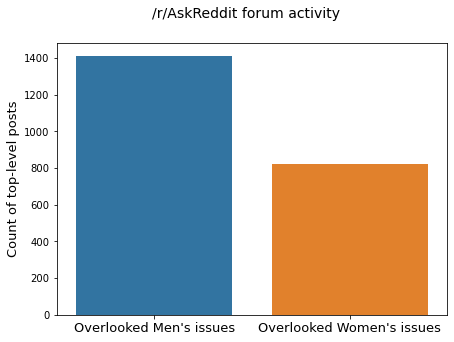

In [14]:
# Show count plot for number of forum comments
fig, ax = plt.subplots(figsize=(7, 5))
fig.suptitle('/r/AskReddit forum activity', fontsize=14)
sns.barplot(x=["Overlooked Men's issues", "Overlooked Women's issues"],
            y=[len(men_comments), len(women_comments)])
plt.ylabel('Count of top-level posts', fontsize=13)
plt.xticks(fontsize=13)
plt.show()

From here, we can see that the forum on men's issues attracted significantly more comments. Since both forums were created on the same date, this was not due to any headstart of the men's forum over the women's forum. This could mean that there are more active male members of Reddit than female members, or perhaps that men are more likely to turn to Reddit to vent their frustrations of issues that affect them, compared to women.

Regardless, we turn to visualizing the importance of the words themselves. While we can tabulate or use bar graphs to show the frequency of TF-IDF scores of the different words, this would not be very efficient. Instead, we use word clouds which are a practical and efficient method for depicting the relative importance of words, by displaying a collection of words whose size are proportional to their frequency and importance.

**Figure 3: Word Cloud for Women's Issues**

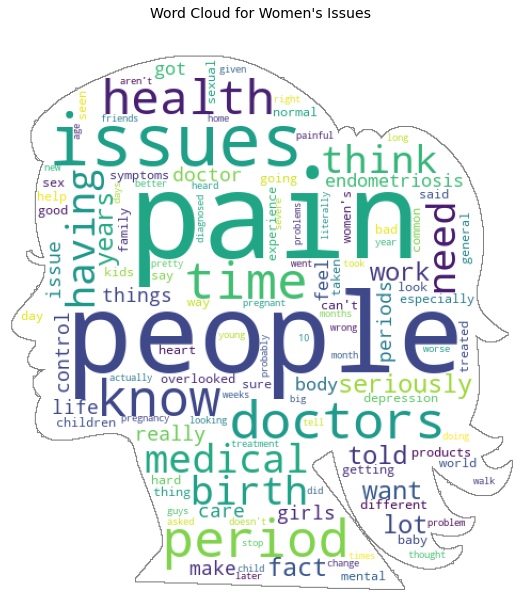

In [15]:
# Create a wordcloud for women's issues as part of EDA
woman_mask = np.array(Image.open('woman_stencil.png'))

wordcloud = (WordCloud(background_color='white', mask=woman_mask,
                       colormap='viridis', contour_width=0.7,
                       contour_color='gray', random_state=42).
             generate_from_frequencies(df_women.sum(axis=0)))
plt.figure(figsize=(20, 10))
ax = plt.gca()
ax.set_title("Word Cloud for Women's Issues", ha='center',
             fontsize=14, pad=30)
plt.axis('off')
plt.imshow(wordcloud)
plt.show()

The initial word cloud shows that concerns of women tend to relate to the words "pain", "people", "health", "issues", "period", "doctors", "medical", "think", "time", and "know". This is suggestive that a number of women's issues might be related health or reproductive functions.

**Figure 4: Word Cloud for Men's Issues**

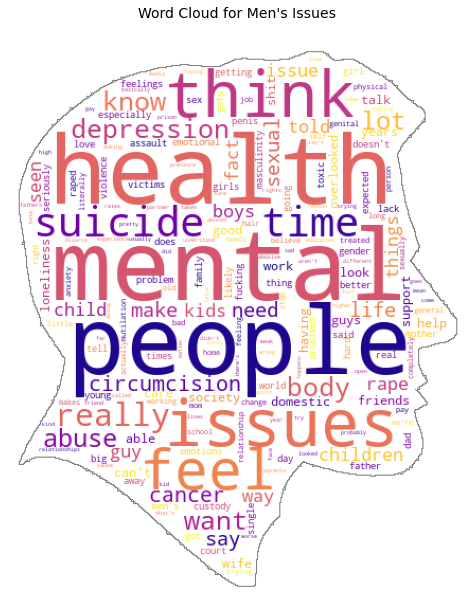

In [16]:
# Create a wordcloud for men's issues as part of EDA
man_mask = np.array(ImageOps.mirror(Image.open('man_stencil.png')))

wordcloud = (WordCloud(background_color='white', mask=man_mask,
                       colormap='plasma', contour_width=0.7,
                       contour_color='gray', random_state=42).
             generate_from_frequencies(df_men.sum(axis=0)))
plt.figure(figsize=(20, 10))
ax = plt.gca()
ax.set_title("Word Cloud for Men's Issues", ha='center',
             fontsize=14, pad=30)
plt.axis('off')
plt.imshow(wordcloud)
plt.show()

The word cloud for men's issues highlights words such as "mental", "health", "people", "think", "feel", "issues", and "suicide". This is an early indication that men may have concerns regarding mental health.

**Figure 5: Word Cloud for All Issues**

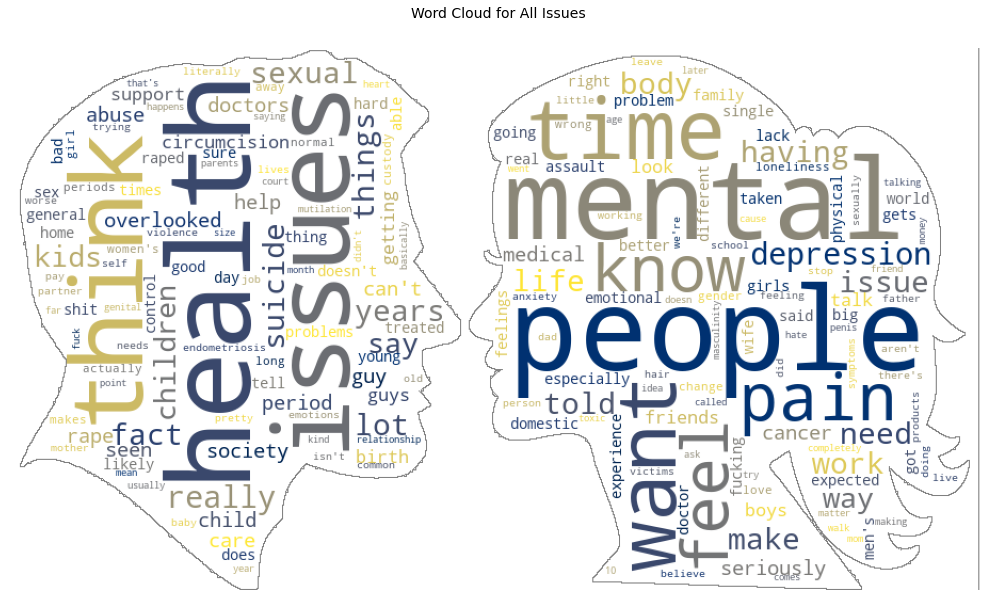

In [17]:
# Create a wordcloud for all issues as part of EDA
couple_mask = np.array(Image.open('couple_stencil.png'))

wordcloud = (WordCloud(background_color='white', mask=couple_mask,
                       colormap='cividis', contour_width=0.7,
                       contour_color='gray', random_state=42).
             generate_from_frequencies(df_all.sum(axis=0)))
plt.figure(figsize=(20, 10))
ax = plt.gca()
ax.set_title("Word Cloud for All Issues", ha='center',
             fontsize=14, pad=30)
plt.axis('off')
plt.imshow(wordcloud)
plt.show()

Combining the datasets for men's and women's issues show that important words common to both genders are: "think", "health", "issues", "time", "mental", "people", "want", "know", "feel", and "pain".

### 6.2 Dimensionality Reduction (SVD/LSA)

With so many new features generated by TF-IDF vectorization, dimensionality reduction was needed to trim down our features to a manageable size before performing clustering. 

Singular Value Decomposition (SVD) or Latent Semantic Analysis (LSA) as applied to text data was the dimensionality reduction technique of choice as the TF-IDF dataset is a particularly sparse dataset.

After performing dimensionality reduction with a captured varianced threshold of 70%, the feature importances for each SV was then explored in order to extract new insights.

In [18]:
# Define svd-related functions
def truncated_svd(X):
    """Perform singular value decomposition on a design matrix X."""
    q, s, p = np.linalg.svd(X, full_matrices=True)
    Q = q
    S = np.diag(s)
    P = p.T
    NSSD = (s / np.sqrt(np.sum(s**2)))**2
    return Q, S, P, NSSD


def project_svd(q, s, k):
    """Project the design matrix on to the first k singular vectors."""
    return q[:, :k].dot(s[:k, :k])

In [19]:
# Create copies of our TF-IDF dataframes to be used for SVD.
Xw = df_women.copy()
Xm = df_men.copy()
Xa = df_all.copy()

In [20]:
# Perform SVD for the men TF-IDF, women TF-IDF and overall TF-IDF
q_w, s_w, p_w, nssd_w = truncated_svd(Xw)
q_m, s_m, p_m, nssd_m = truncated_svd(Xm)
q_a, s_a, p_a, nssd_a = truncated_svd(Xa)

#### Retaining Top Singular Values (SV's)

In [21]:
# Define function to get the SV count needed for an input variance threshold
def get_sv_count(nssd, thresh):
    """Return the minimum SV count needed to reach variance threshold."""

    fig, ax = plt.subplots(figsize=(7, 5))
    ax.plot(range(1, len(nssd)+1), nssd, '-', label='Individual')
    ax.plot(range(1, len(nssd)+1), nssd.cumsum(), 'r-', label='Cumulative')
    ax.axhline(thresh, ls='--', color='#808080')
    ax.legend()
    ax.set_xlim(0, len(nssd)+1)
    ax.set_xlabel('SV', fontsize=12)
    ax.set_ylabel('Variance explained', fontsize=12)
    ind = bisect.bisect(nssd.cumsum(), thresh) + 1
    ax.axvline(ind, ls='--', color='green')
    plt.xticks(fontsize=11)
    plt.yticks(fontsize=11)
    print(f'\nTo capture at least {thresh*100}% of the variance, '
          f'{ind} SVs are required.')
    return ind

# Define the variance threshold to 70%.
svd_thresh = 0.7

With a captured dataset variance of 70%, the number of dimensions for the women TF-IDF matrix, men TF-IDF matrix and overall TF-IDF matrix was reduced by more than half.

- 119 original features -> 53 SVs for women TF-IDF matrix
- 285 original features -> 112 SVs for men TF-IDF matrix
- 473 original features -> 184 SVs for overall TF-IDF matrix

**Figure 6: Singular Value Decomposition for Women's TF-IDF**


To capture at least 70.0% of the variance, 53 SVs are required.


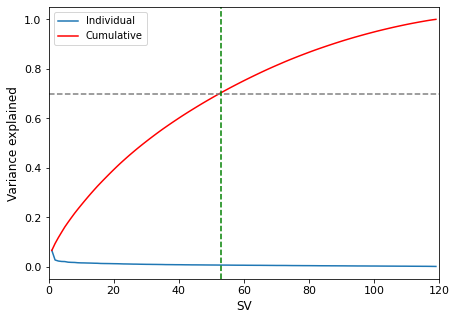

In [22]:
# Get the number of SVs needed for women TF-IDF
sv_count_w = get_sv_count(nssd_w, svd_thresh)

**Figure 7: Singular Value Decomposition for Men's TF-IDF**


To capture at least 70.0% of the variance, 112 SVs are required.


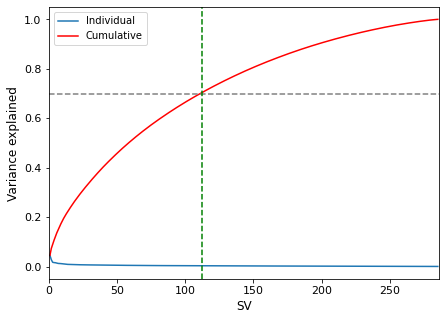

In [23]:
# Get the number of SVs needed for men TF-IDF
sv_count_m = get_sv_count(nssd_m, svd_thresh)

**Figure 8: Singular Value Decomposition for Overall TF-IDF**


To capture at least 70.0% of the variance, 184 SVs are required.


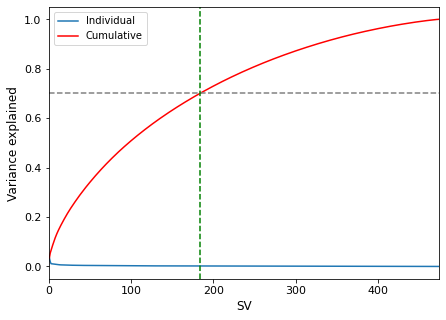

In [24]:
# Get the number of SVs needed for overall TF-IDF
sv_count_a = get_sv_count(nssd_a, svd_thresh)

In [25]:
# Project the original TF-IDF data into its new SV equivalents
Xw_new = project_svd(q_w, s_w, sv_count_w)
Xm_new = project_svd(q_m, s_m, sv_count_m)
Xa_new = project_svd(q_a, s_a, sv_count_a)

#### SV Feature Interpretations

Next, we looked at the feature importances of the first 5 SVs of the dimensionally reduced TF-IDF matrices (women, men, overall) to extract initial insights.

A wordcloud for each direction in the SV axis was also added to help with interpretability of negatively weighted and positively weighted features.

In [23]:
# Define function to generate barcharts for feature importance across SVs
def graph_svs(sv, feature_names, p, mask_image):
    """Plots a barchart and wordclouds of feature importances for each SV."""

    if not isinstance(sv, list):
        # Generate bar chart
        fig, ax = plt.subplots(1, 3, figsize=(16, 5))
        order = np.argsort(np.abs(p[:, sv]))[-15:]
        ax[0].barh([feature_names[o] for o in order], p[order, sv],
                   color='#ffe87c')
        ax[0].set_title(f'SV{sv+1}')

        # Generate word cloud for negative features
        mask = np.array(Image.open(mask_image))
        word_order_neg = np.argsort((p[:, sv]))[:100]
        weights_neg = pd.Series(p[word_order_neg, sv]).abs()
        weights_neg = ((weights_neg - weights_neg.min()) /
                       (weights_neg.max() - weights_neg.min()))
        weights_neg.index = feature_names[word_order_neg]
        wordcloud = (WordCloud(background_color='white', mask=mask,
                               colormap='viridis', contour_width=1,
                               random_state=42).
                     generate_from_frequencies(weights_neg))
        ax[1].axis('off')
        ax[1].imshow(wordcloud)
        ax[1].set_title(f'Most negative contributions to SV{sv+1}')

        # Generate word cloud for positive features
        mask = np.array(ImageOps.mirror(Image.open(mask_image)))
        word_order_pos = np.argsort((p[:, sv]))[-100:]
        weights_pos = pd.Series(p[word_order_pos, sv])
        weights_pos = ((weights_pos - weights_pos.min()) /
                       (weights_pos.max() - weights_pos.min()))
        weights_pos.index = feature_names[word_order_pos]
        weights_pos = weights_pos.sort_values(ascending=False)
        wordcloud = (WordCloud(background_color='white', mask=mask,
                               colormap='plasma', contour_width=1).
                     generate_from_frequencies(weights_pos))
        ax[2].axis('off')
        ax[2].set_title(f'Most positive contributions to SV{sv+1}')
        ax[2].imshow(wordcloud)

##### **Women's SVD Insights**
- SV1 relates to pain, medical issues, and dealing with doctors
- Positive SV2 relates to pain, periods, doctors, and endmoetriosis.  Negative SV2 seems to relate to what people know and think (perceptions and facts).
- Positive SV3 relates to serious and overlooked medical issues.  Negative SV3 relates to periods, birth control, and related products.
- Positive SV4 relates mainly to birth control and depression.  Negative SV4 relates again to what people think and know.
- Positive SV5 relates to wanting or having children.  Negative SV5 relates to issues and products related to periods.

**Figure 9: Women's SVD Feature Importances and Wordclouds**

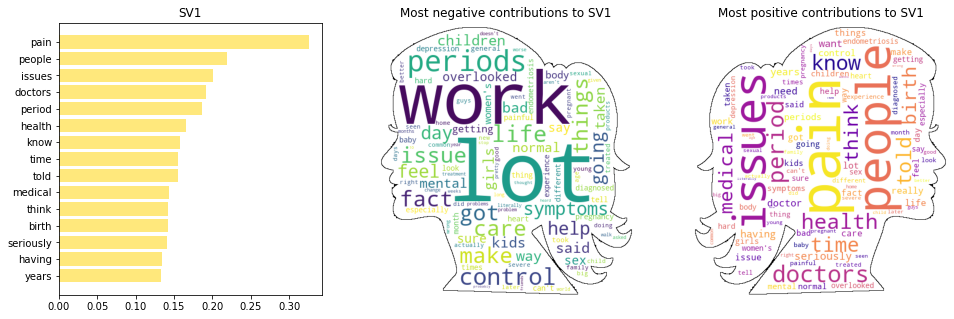

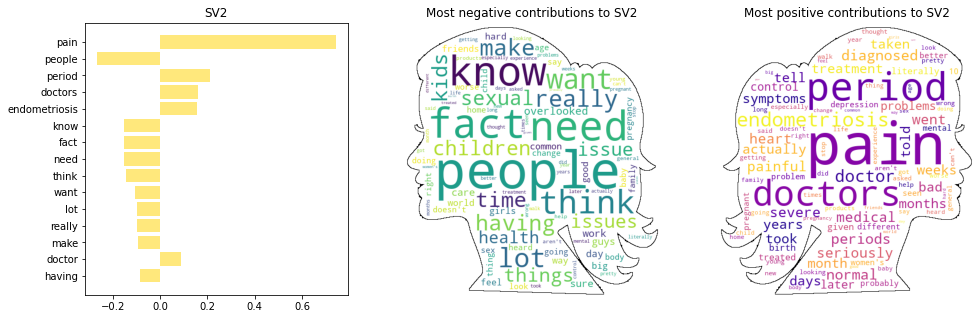

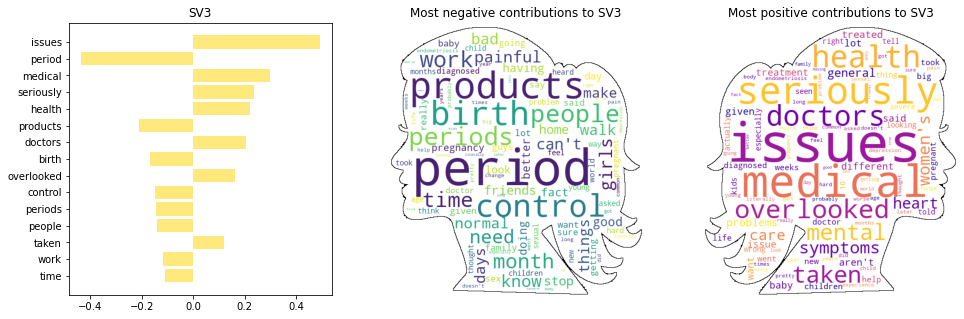

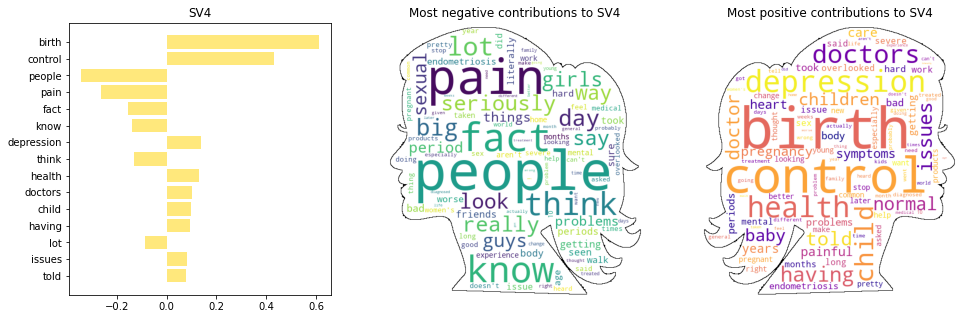

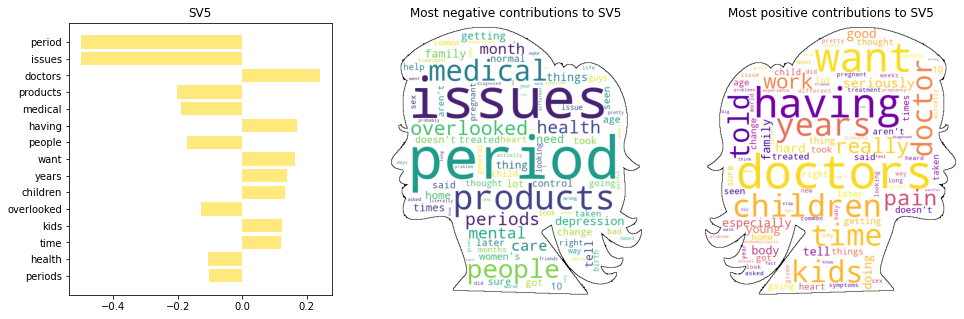

In [24]:
# Generate feature importance barcharts across 10 SVs for women TF-IDF
feature_names = df_women.columns
for i in range(0, 5):
    graph_svs(i, feature_names, p_w, 'woman_stencil.png')

##### **Men's SVD Insights**
- SV1 relates mainly to mental health, depression, and suicide.
- Positive SV2 relates to mental health.  Negative SV2 relates to what people want, think, and know.
- SV3 relates mainly to circumcision and genital mutilation.
- Positive SV4 relates to cancer, domestic abuse, and sexual assault/violence.  Negative SV4 relates to feelings and mental health.
- Positive SV5 relates to cancer.  Negative SV5 relates to sexual and domestive abuse, rape, and violence.

**Figure 10: Men's SVD Feature Importances and Wordclouds**

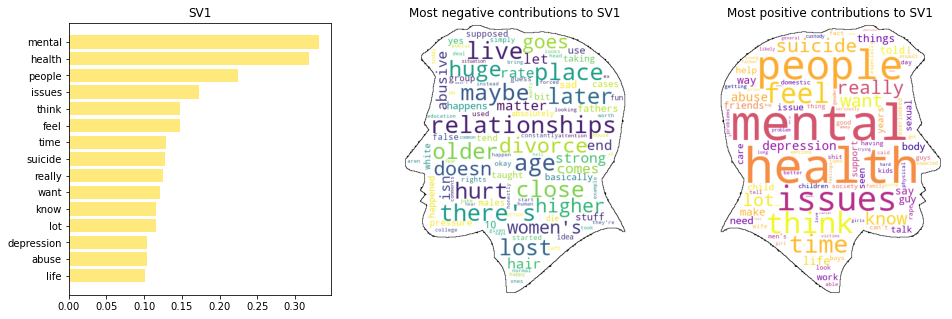

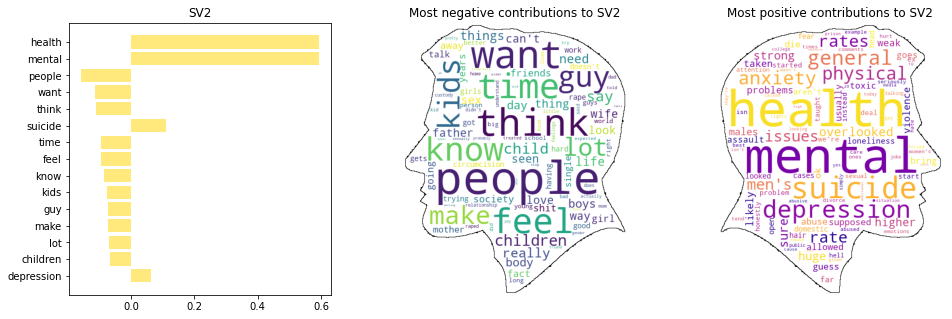

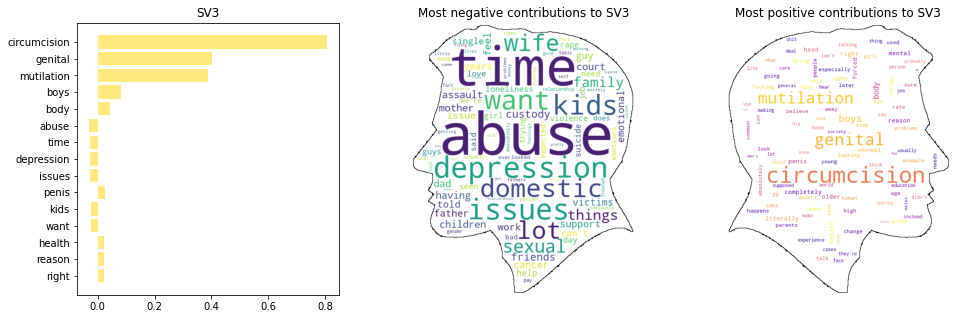

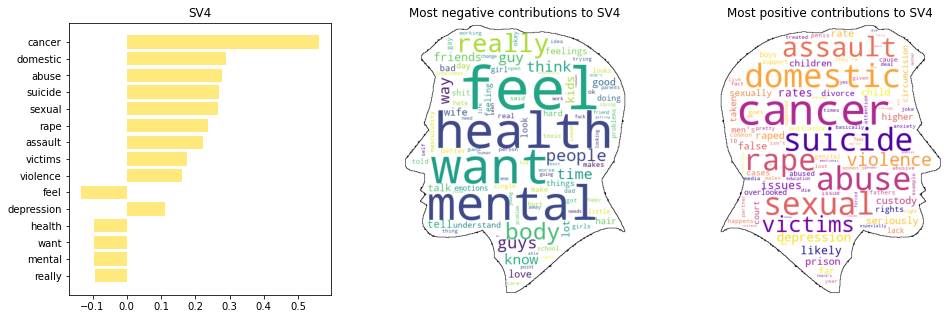

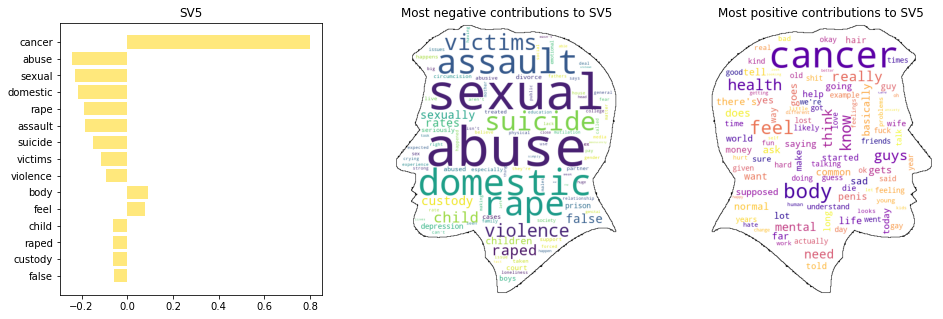

In [25]:
# Generate feature importance barcharts across 10 SVs for men TF-IDF
feature_names = df_men.columns
for i in range(0, 5):
    graph_svs(i, feature_names, p_m, 'man_stencil.png')

##### **Overall SVD Insights**
- SV1 relates to mental health, what people want/think/feel, and pain.
- SV2 relates mainly to mental health.
- Positive SV3 relates to pain, doctors, periods, and cancer.  Negative SV3 relates to sexual/domestic assault, rape, and suicide.
- SV4 relates mainly to depression.
- Positive SV5 relates to cancer, pain, and rape or sexual/domestic assault.  Negative SV5 relates to depression.

**Figure 11: Overall SVD Feature Importances and Wordclouds**

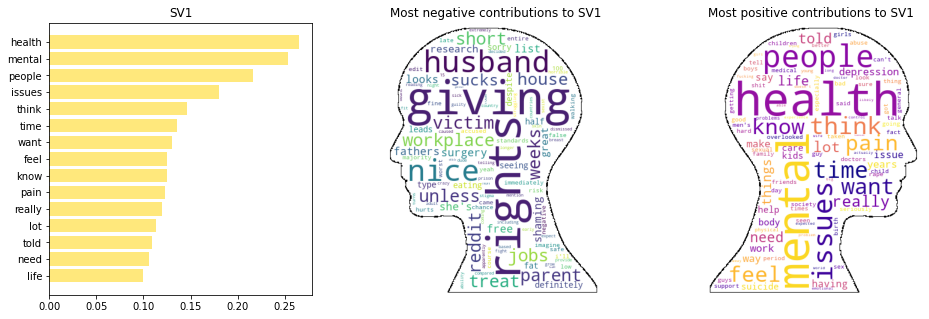

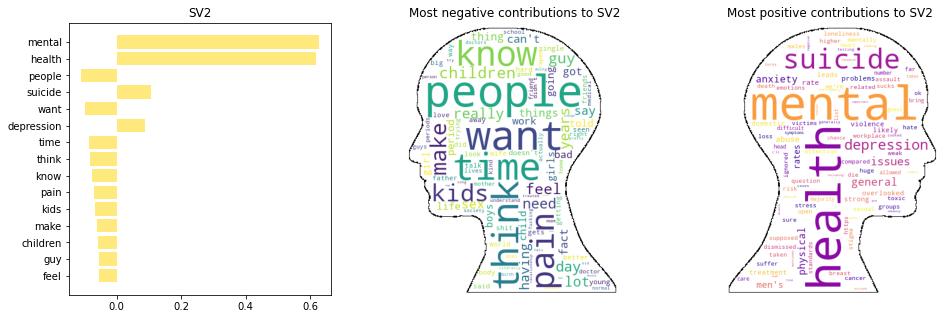

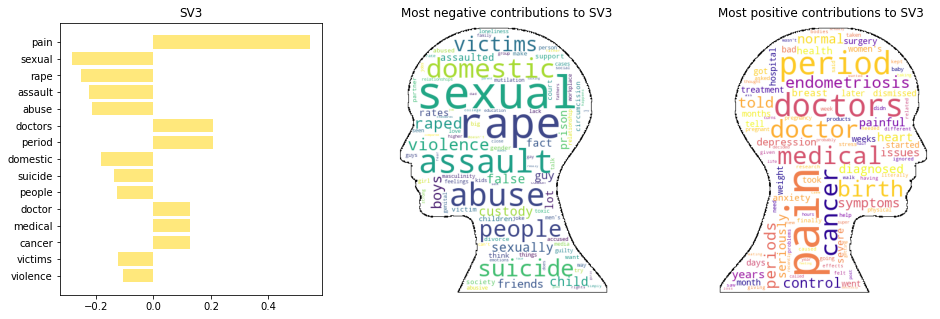

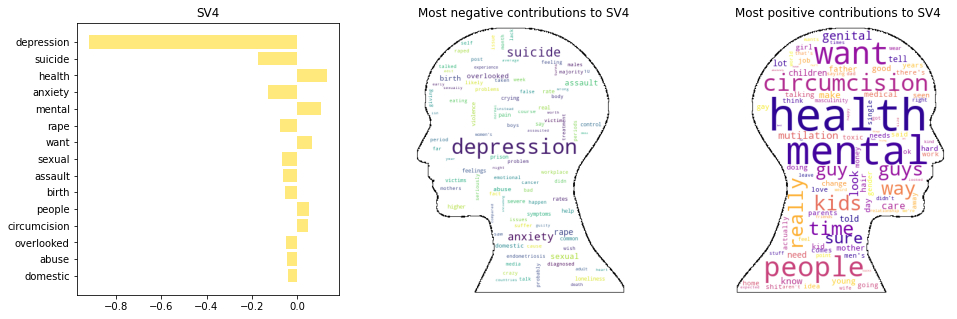

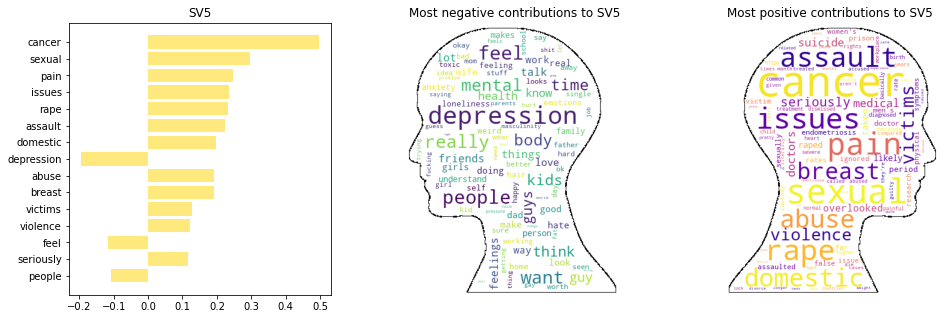

In [26]:
# Generate feature importance barcharts across 10 SVs for overall TF-IDF
feature_names = df_all.columns
for i in range(0, 5):
    graph_svs(i, feature_names, p_a, 'head_stencil.png')

### 6.3 Clustering

Next, clustering was then performed on the dimensionally reduced dataset in order to categorize the dataset around specific themes and issues.

Agglomerative clustering and representative-based clustering (K-means, K-medians, k-medoids) was performed for both the men's dataset and the women's dataset.

For agglomerative clustering, visual inspection was done to assess the separation, balance and parsimony of the generated clusters.

For representative-based clustering, internal validation statistics were derived for k clusters from 1 to 10. 

The visual inspection results for agglomerative clustering and internal validation results for representative-based clustering will be compared in the next section to select the optimal clustering method and number of clusters.

#### Agglomerative Clustering

In [28]:
# Define function for plotting agglomerative clustering dendrograms
def plot_hierarchical(df, method, t):
    """Plot dendrogram and SV scatter plot for a given delta threshold."""

    # Generate dendrogram using input method
    Z = linkage(df, method=method, optimal_ordering=True)
    fig, ax = plt.subplots(1, 4, figsize=(25, 5))
    dn = dendrogram(Z, ax=ax[0], p=5,
                    truncate_mode='level',
                    color_threshold=t)
    ax[0].set_ylabel(r'$\Delta$')
    fig.suptitle(method.title(), fontsize=16)
    y_predict = fcluster(Z, t=t, criterion='distance')
    print(f'{len(set(y_predict))} clusters generated.')

    # Generate scatter plots across 3 SVs.
    ax[1].scatter(df[:, 0], df[:, 1], c=y_predict)
    ax[1].set_xlabel('SV1')
    ax[1].set_ylabel('SV2')
    ax[2].scatter(df[:, 1], df[:, 2], c=y_predict)
    ax[2].set_xlabel('SV2')
    ax[2].set_ylabel('SV3')
    ax[3].scatter(df[:, 0], df[:, 2], c=y_predict)
    ax[3].set_xlabel('SV1')
    ax[3].set_ylabel('SV3')
    return len(set(y_predict))

Figures 12 and 13 show the agglomerative clustering results using Ward's method, single linkage, complete linkage and average linkage.

**Figure 12: Agglomerative Clustering for Women's Comments**

5 clusters generated.
70 clusters generated.
52 clusters generated.
27 clusters generated.


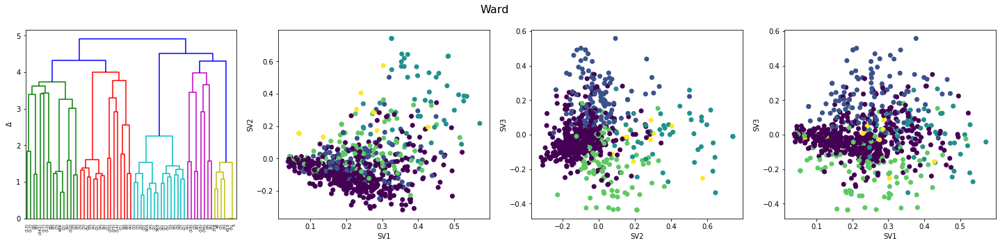

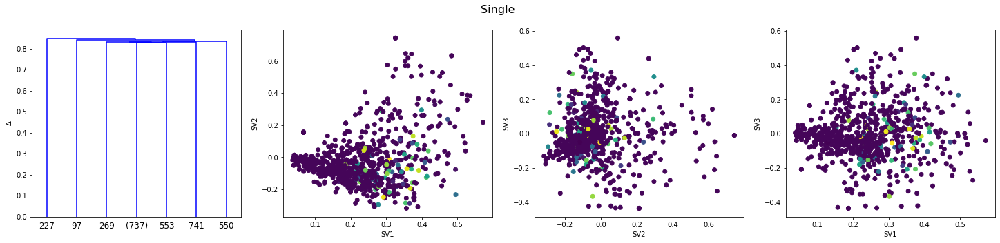

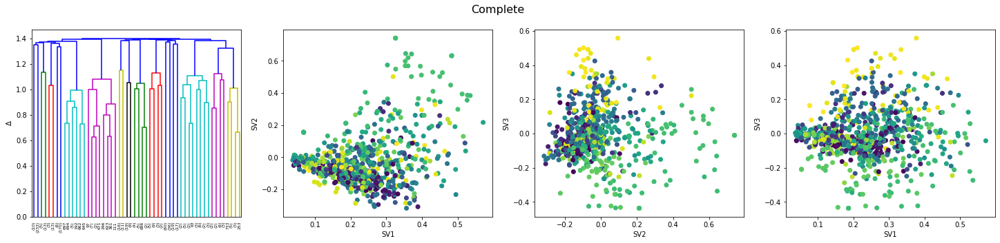

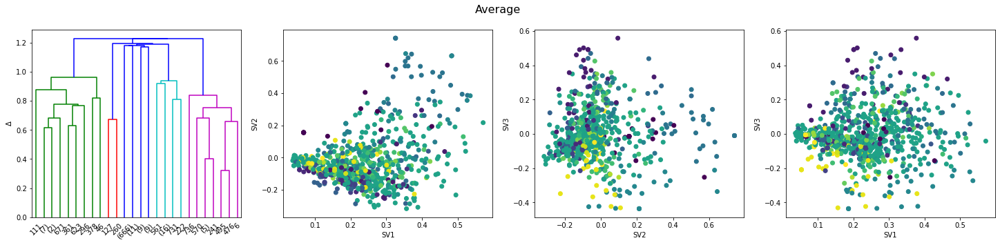

In [ ]:
# Plot the dendrogram and SV representations for women TF-IDF
w_methods = [('ward', 4.2), ('single', 0.75),
             ('complete', 1.2), ('average', 1.1)]
w_hierarchal = []
for method in w_methods:
    w_hierarchal.append(plot_hierarchical(Xw_new, method[0], method[1]))

**Figure 13: Agglomerative Clustering for Men's Comments**

4 clusters generated.
370 clusters generated.
56 clusters generated.
75 clusters generated.


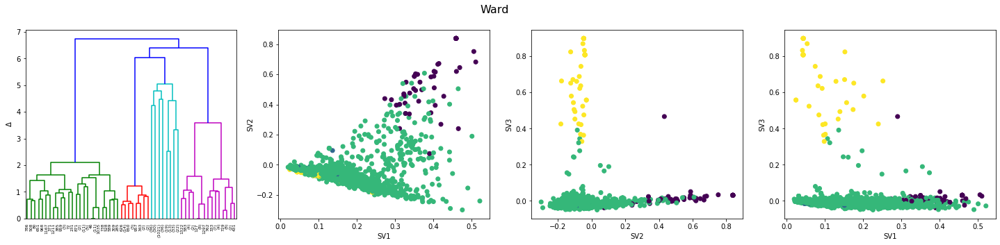

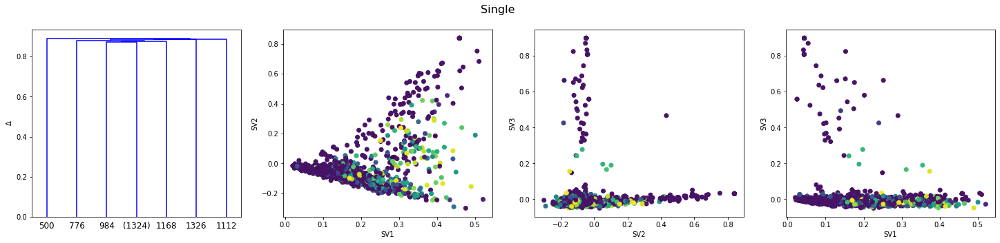

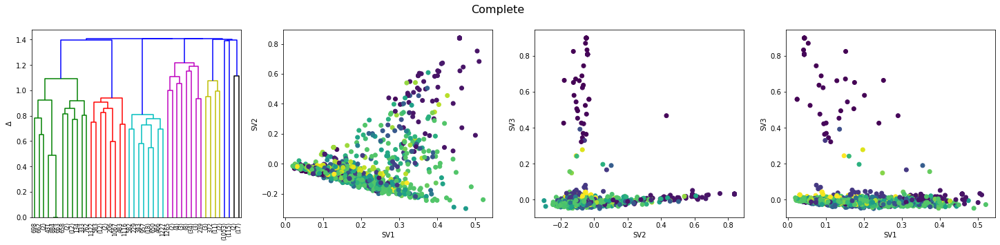

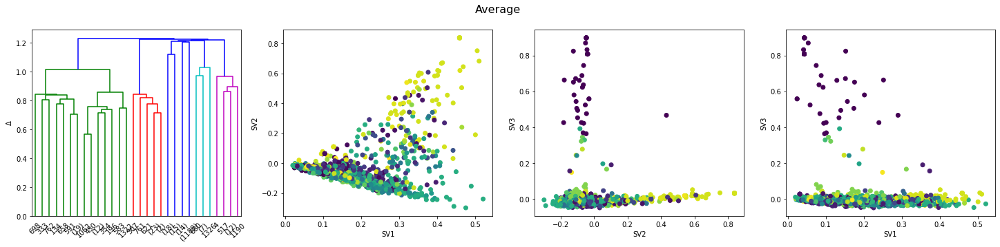

In [ ]:
# Plot the dendrogram and SV representations for men TF-IDF
m_methods = [('ward', 5.5), ('single', 0.75),
             ('complete', 1.3), ('average', 1.05)]
m_hierarchal = []
for method in m_methods:
    m_hierarchal.append(plot_hierarchical(Xm_new, method[0], method[1]))

In [29]:
# Define functions for Kmeans internal validation statistics
def pooled_within_ssd(X, y, centroids, dist):
    """Compute pooled within-cluster sum of squares around cluster mean."""

    w_k = 0
    for i in range(len(centroids)):
        n = len(X[y == i])
        for j in range(n):
            w_k += (1/(2*n))*dist(X[y == i][j], centroids[i])**2
    return w_k


def gap_statistic(X, y, centroids, dist, b, clusterer, random_state=1337):
    """Compute the gap statistic."""

    rng = np.random.default_rng(random_state)
    gap_k = []
    w_k = pooled_within_ssd(X, y, centroids, dist)
    if isinstance(X, np.matrix):
        X = np.array(X)
    for i in range(b):
        X_sim = rng.random(size=X.shape) * (X.max(axis=0) - X.min(axis=0))
        y_sim = clusterer.fit_predict(X_sim)
        centroids_sim = clusterer.cluster_centers_
        w_k_i = pooled_within_ssd(X_sim, y_sim, centroids_sim, dist)
        gap_k.append(np.log(w_k_i) - np.log(w_k))
    gs = np.mean(gap_k)
    gs_std = np.std(gap_k)
    return gs, gs_std


def cluster_range(X, clusterer, k_start, k_stop):
    """Perform clusterings on a dataset and return scores based on k."""

    ys = []
    centers = []
    inertias = []
    chs = []
    scs = []
    gss = []
    gssds = []
    np.random.seed(1337)
    for k in range(k_start, k_stop+1):
        clusterer_k = clone(clusterer)
        clusterer_k.n_clusters = k
        clusterer_k.fit(X)
        y = clusterer_k.labels_
        ys.append(y)
        centers.append(clusterer_k.cluster_centers_)
        inertias.append(clusterer_k.inertia_)
        chs.append(calinski_harabasz_score(X, y))
        scs.append(silhouette_score(X, y, random_state=1337))
        gs = gap_statistic(X, y, clusterer_k.cluster_centers_,
                           euclidean, 5,
                           clone(clusterer).set_params(n_clusters=k),
                           random_state=1337)
        gss.append(gs[0])
        gssds.append(gs[1])
    results_dict = {}
    results_dict['ys'] = ys
    results_dict['centers'] = centers
    results_dict['inertias'] = inertias
    results_dict['chs'] = chs
    results_dict['scs'] = scs
    results_dict['gss'] = gss
    results_dict['gssds'] = gssds
    return results_dict

In [30]:
# Define function for internal validation plots.
def plot_internal(inertias, chs, scs, gss, gssds):
    """Plot internal validation values."""

    fig, ax = plt.subplots(1, 4, figsize=(14, 4), constrained_layout=True)
    ks = np.arange(2, len(inertias)+2)
    ax[0].plot(ks, inertias, '-o', label='SSE')
    ax[0].set_xlabel('$k$')
    ax[0].set_ylabel('SSE')
    ax[0].set_xticks(ks)
    ax[0].legend()
    ax[1].plot(ks, chs, '-ro', label='CH')
    ax[1].set_xlabel('$k$')
    ax[1].set_ylabel('CH')
    ax[1].set_xticks(ks)
    ax[1].legend()
    ax[2].plot(ks, scs, '-ko', label='Silhouette')
    ax[2].set_xlabel('$k$')
    ax[2].set_ylabel('Silhouette')
    ax[2].set_xticks(ks)
    ax[2].legend()
    ax[3].errorbar(ks, gss, gssds, fmt='-go', label='Gap statistic')
    ax[3].set_xlabel('$k$')
    ax[3].set_ylabel('Gap Statistic')
    ax[3].set_xticks(ks)
    ax[3].legend()
    plt.suptitle('Internal validation')
    # plt.tight_layout()
    return ax

Next, representative-based clustering was done for both the women's dataset and men's dataset. Figures 14 to 19 show the internal validation plots for each clustering method and dataset.

#### K-Means

**Figure 14: Internal Validation Plots for K-Means Clustering of Women's Dataset**

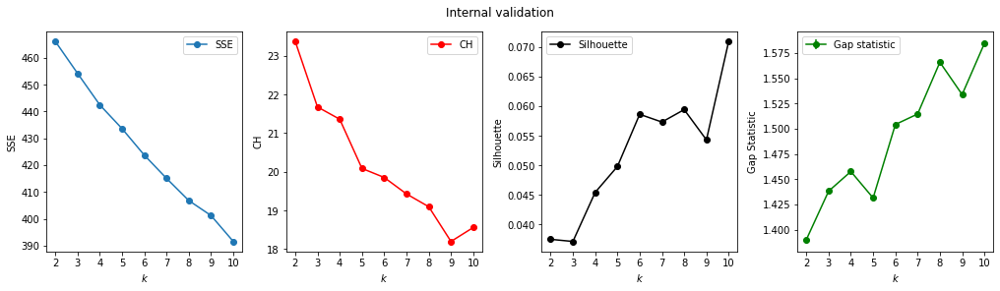

In [ ]:
# Plot internal validation plots for women K-means clustering
res_w = cluster_range(Xw_new, KMeans(random_state=922), 2, 10)
plot_internal(res_w['inertias'], res_w['chs'],
              res_w['scs'], res_w['gss'], res_w['gssds'])
plt.show()

**Figure 15: Internal Validation Plots for K-Means Clustering of Men's Dataset**

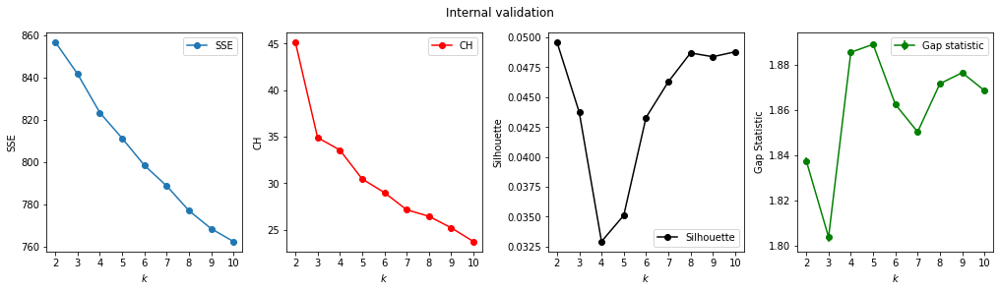

In [ ]:
# Plot internal validation plots for men K-means clustering
res_m = cluster_range(Xm_new, KMeans(random_state=922), 2, 10)
plot_internal(res_m['inertias'], res_m['chs'],
              res_m['scs'], res_m['gss'], res_m['gssds'])
plt.show()

#### K-Medians

**Figure 16: Internal Validation Plots for K-Medians Clustering of Women's Dataset**

In [31]:
# Define functions for KMedians internal validation statistics
def gap_statistic_kmedians(X, y, centroids, b):
    """Compute the gap statistic for a k-medians clusterer."""
    np.random.seed(1337)
    gap_k = []
    w_k = pooled_within_ssd(X, y, centroids, cityblock)
    for i in range(b):
        X_sim = (np.random.random(size=X.shape) *
                 (X.max(axis=0) - X.min(axis=0)))
        kmd = kmedians(X_sim, X_sim[:len(centroids), :], ccore=True)
        kmd.process()
        clusters = kmd.get_clusters()
        medians_sim = kmd.get_medians()
        y_sim = np.zeros(len(X))
        for cluster, point in enumerate(clusters):
            y_sim[point] = cluster
        y_sim = y_sim.astype(int)
        w_k_i = pooled_within_ssd(X_sim, y_sim, medians_sim, cityblock)
        gap_k.append(np.log(w_k_i) - np.log(w_k))
    gs = np.mean(gap_k)
    gs_std = np.std(gap_k)
    return gs, gs_std


def cluster_range_kmedians(X, k_start, k_stop):
    """Apply kmedian clusterings and evaluate based on values for k."""
    ys = []
    centers = []
    inertias = []
    chs = []
    scs = []
    gss = []
    gssds = []
    for k in range(k_start, k_stop+1):
        clusterer_k = kmedians(X, X[:k, :], ccore=True)
        clusterer_k.process()
        clusters = clusterer_k.get_clusters()
        y = np.zeros(len(X))
        for cluster, point in enumerate(clusters):
            y[point] = cluster
        y = y.astype(int)
        ys.append(y)
        medians = clusterer_k.get_medians()
        centers.append(medians)
        distances = []
        for i, label in enumerate(y):
            distances.append(euclidean(medians[label], X[i])**2)
        inertias.append(np.sum(distances))
        chs.append(calinski_harabasz_score(X, y))
        scs.append(silhouette_score(X, y, random_state=1337))
        gs = gap_statistic_kmedians(X, y, clusterer_k.get_medians(), 5)
        gss.append(gs[0])
        gssds.append(gs[1])
    results_dict = {}
    results_dict['ys'] = ys
    results_dict['centers'] = centers
    results_dict['inertias'] = inertias
    results_dict['chs'] = chs
    results_dict['scs'] = scs
    results_dict['gss'] = gss
    results_dict['gssds'] = gssds
    return results_dict

**Figure 17: Internal Validation Plots for K-Medians Clustering of Men's Dataset**

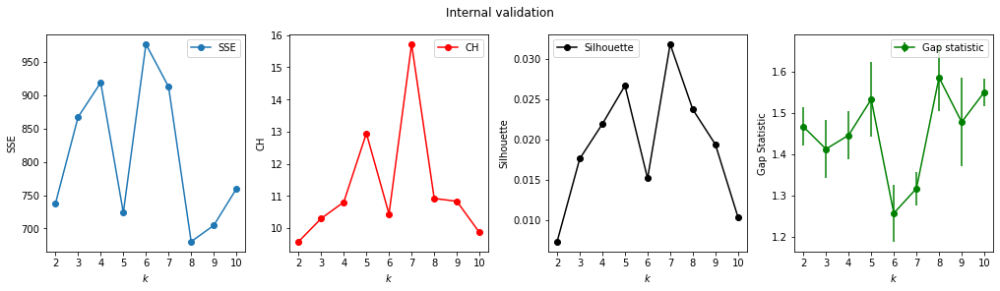

In [ ]:
# Plot internal validation plots for women K-medians clustering
res_kmd_w = cluster_range_kmedians(np.array(Xw_new), 2, 10)
plot_internal(res_kmd_w['inertias'], res_kmd_w['chs'],
              res_kmd_w['scs'], res_kmd_w['gss'], res_kmd_w['gssds'])
plt.show()

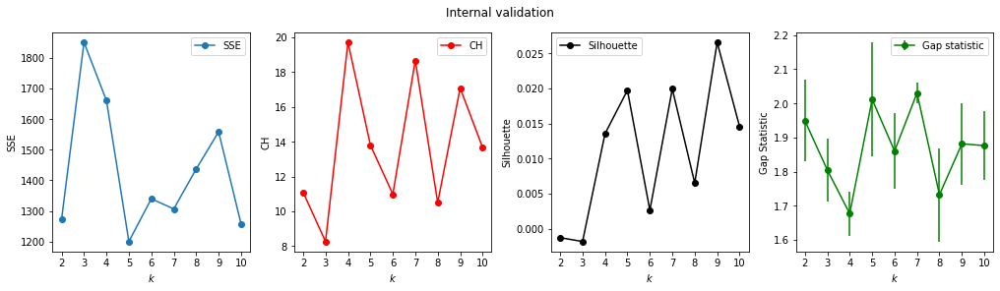

In [ ]:
# Plot internal validation plots for men K-medians clustering
res_kmd_m = cluster_range_kmedians(np.array(Xm_new), 2, 10)
plot_internal(res_kmd_m['inertias'], res_kmd_m['chs'],
              res_kmd_m['scs'], res_kmd_m['gss'], res_kmd_m['gssds'])
plt.show()

#### K-Medoids

In [32]:
# Define functions for KMedoids internal validation statistics
def gap_statistic_kmedoids(X, y, centroids, b):
    """Compute the gap statistic for a k-medoids clusterer."""
    np.random.seed(1337)
    gap_k = []
    w_k = pooled_within_ssd(X, y, centroids, euclidean)
    for i in range(b):
        X_sim = (np.random.random(size=X.shape) *
                 (X.max(axis=0) - X.min(axis=0)))
        kmo = kmedoids(X_sim, np.arange(len(centroids)), ccore=True)
        kmo.process()
        clusters = kmo.get_clusters()
        centroids_sim = X_sim[kmo.get_medoids(), :]
        y_sim = np.zeros(len(X))
        for cluster, point in enumerate(clusters):
            y_sim[point] = cluster
        y_sim = y_sim.astype(int)
        w_k_i = pooled_within_ssd(X_sim, y_sim, centroids_sim, euclidean)
        gap_k.append(np.log(w_k_i) - np.log(w_k))
    gs = np.mean(gap_k)
    gs_std = np.std(gap_k)
    return gs, gs_std


def cluster_range_kmedoids(X, k_start, k_stop):
    """Apply kmedoid clusterings and evaluate based on values for k."""

    ys = []
    centers = []
    inertias = []
    chs = []
    scs = []
    gss = []
    gssds = []
    for k in range(k_start, k_stop+1):
        clusterer_k = kmedoids(X, np.arange(k), ccore=True)
        clusterer_k.process()
        clusters = clusterer_k.get_clusters()
        y = np.zeros(len(X))
        for cluster, point in enumerate(clusters):
            y[point] = cluster
        y = y.astype(int)
        ys.append(y)
        medoids = clusterer_k.get_medoids()
        centers.append(X[medoids])
        distances = []
        for i, label in enumerate(y):
            distances.append(euclidean(medoids[label], X[i])**2)
        inertias.append(np.sum(distances))
        chs.append(calinski_harabasz_score(X, y))
        scs.append(silhouette_score(X, y, random_state=1337))
        gs = gap_statistic_kmedoids(X, y, X[medoids], 5)
        gss.append(gs[0])
        gssds.append(gs[1])
    results_dict = {}
    results_dict['ys'] = ys
    results_dict['centers'] = centers
    results_dict['inertias'] = inertias
    results_dict['chs'] = chs
    results_dict['scs'] = scs
    results_dict['gss'] = gss
    results_dict['gssds'] = gssds
    return results_dict

**Figure 18: Internal Validation Plots for K-Medoids Clustering of Women's Dataset**

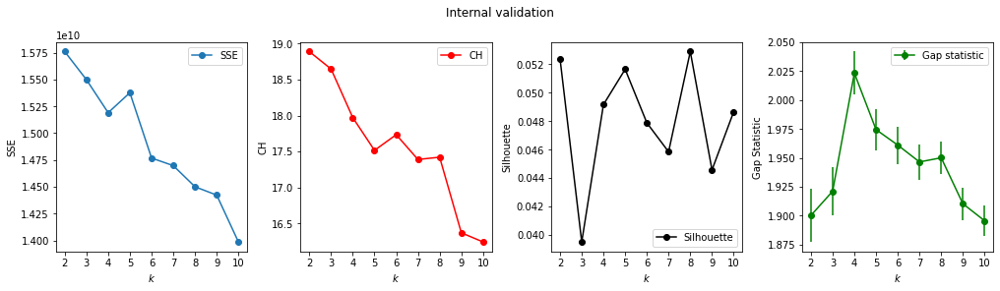

In [ ]:
# Plot internal validation plots for women K-medoids clustering
res_kmo_w = cluster_range_kmedoids(np.array(Xw_new), 2, 10)
plot_internal(res_kmo_w['inertias'], res_kmo_w['chs'],
              res_kmo_w['scs'], res_kmo_w['gss'], res_kmo_w['gssds'])
plt.show()

**Figure 19: Internal Validation Plots for K-Medoids Clustering of Men's Dataset**

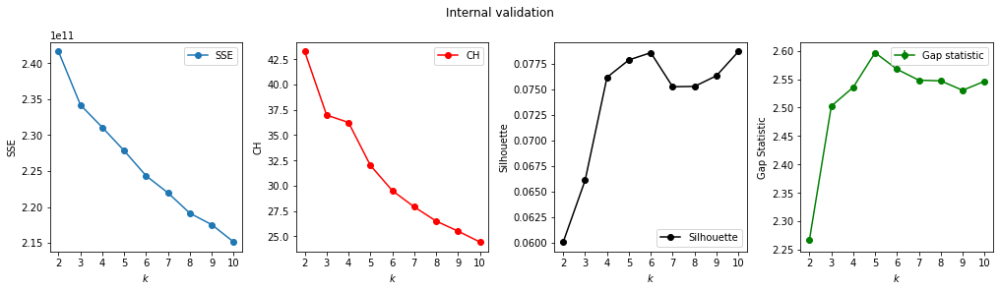

In [ ]:
# Plot internal validation plots for men K-medoids clustering
res_kmo_m = cluster_range_kmedoids(np.array(Xm_new), 2, 10)
plot_internal(res_kmo_m['inertias'], res_kmo_m['chs'],
              res_kmo_m['scs'], res_kmo_m['gss'], res_kmo_m['gssds'])
plt.show()

## 7 Results and Discussion

### 7.1 Choice of Clustering Method and Value for *k*

Having attempted to cluster the data using different methods, the next step was to compare these, and select a clustering method along with the corresponding number of clusters (k). First, the methods used for hierarchal or agglomerative clusters were compared.

**Table 4: Summary of Number of Clusters found Using Hierarchal Clustering Methods**

In [ ]:
# Generate table for agglomerative clustering results
cols = ['Gender', 'Ward', 'Single', 'Complete', 'Average']
row1 = ['Women'] + w_hierarchal
row2 = ['Men'] + m_hierarchal

agg_summmary = pd.DataFrame(columns=cols)
agg_summmary.loc[0] = row1
agg_summmary.loc[1] = row2
agg_summmary.set_index(['Gender'])

,Ward,Single,Complete,Average
Gender,,,,
Women,5,70,52,27
Men,4,370,56,75


As observed previously, only Ward's Method resulted in a number of clusters that was practical for the purpose of this analysis, as other methods resulted in dozens if not hundreds of clusters, which are too unwieldy for comparison. Still, there was not clear separation seen using Ward's Method, based on the pairwise scatterplots of SV1, SV2, and SV3. Also, it was noted that the comments on women's issues resulted in a different number of clusters compared to the comments on men's issues.

**Table 5: Summary of Number of Clusters Recommended Using Representative Clustering Methods**

In [ ]:
# Generate table for clustering internal validation results
cols = ['Gender', 'Method', 'SSE (low or elbow)', 'CH (high)',
        'Silhouette (high)', 'Gap (high)', 'Findings']
row0 = ['Women', 'K-means', '9 or 10', '2 or 3',
        '10', '8, 9 or 10', '3 out of 4 metrics recommend k=10']
row1 = ['Women', 'K-medians', '2, 5, 8, or 9', '7',
        '5 or 7', '5 or 8', '3 out of 4 metrics recommend k=5']
row2 = ['Women', 'K-medoids', '10', '2 or 3',
        '2, 5, or 8', '4', '2 out of 4 metrics recommend k=2']
row3 = ['Men', 'K-means', '9 or 10', '2',
        '2, 8, 9, or 10', '4, 5, 8, 9, or 10',
        '3 out of 4 metrics recommend k=9 or 10']
row4 = ['Men', 'K-medians', '2, 5, or 10', '4, 7, or 9',
        '5, 7, or 9', '5, 8, or 10', '3 out of 4 metrics recommend k=5']
row5 = ['Men', 'K-medoids', '3, 9 or 10', '2',
        '4 to 10', '4 to 10', '3 out of 4 metrics recommend k=9 or 10']

rep_summmary = pd.DataFrame(columns=cols)
rep_summmary.loc[0] = row0
rep_summmary.loc[1] = row1
rep_summmary.loc[2] = row2
rep_summmary.loc[3] = row3
rep_summmary.loc[4] = row4
rep_summmary.loc[5] = row5
rep_summmary.set_index(['Gender', 'Method', 'Findings'])

SSE (low or elbow)  \
Gender Method    Findings                                                    
Women  K-means   3 out of 4 metrics recommend k=10                 9 or 10   
       K-medians 3 out of 4 metrics recommend k=5            2, 5, 8, or 9   
       K-medoids 2 out of 4 metrics recommend k=2                       10   
Men    K-means   3 out of 4 metrics recommend k=9 or 10            9 or 10   
       K-medians 3 out of 4 metrics recommend k=5              2, 5, or 10   
       K-medoids 3 out of 4 metrics recommend k=9 or 10         3, 9 or 10   

                                                          CH (high)  \
Gender Method    Findings                                             
Women  K-means   3 out of 4 metrics recommend k=10           2 or 3   
       K-medians 3 out of 4 metrics recommend k=5                 7   
       K-medoids 2 out of 4 metrics recommend k=2            2 or 3   
Men    K-means   3 out of 4 metrics recommend k=9 or 10           2   
       K-medians 3 out of 4 metrics recommend k=5        4, 7, or 9   
       K-medoids 3 out of 4 metrics recommend k=9 or 10           2   

                                                        Silhouette (high)  \
Gender Method    Findings                                                   
Women  K-means   3 out of 4 metrics recommend k=10                     10   
       K-medians 3 out of 4 metrics recommend k=5                  5 or 7   
       K-medoids 2 out of 4 metrics recommend k=2              2, 5, or 8   
Men    K-means   3 out of 4 metrics recommend k=9 or 10    2, 8, 9, or 10   
       K-medians 3 out of 4 metrics recommend k=5              5, 7, or 9   
       K-medoids 3 out of 4 metrics recommend k=9 or 10           4 to 10   

                                                                Gap (high)  
Gender Method    Findings                                                   
Women  K-means   3 out of 4 metrics recommend k=10              8, 9 or 10  
       K-medians 3 out of 4 metrics recommend k=5                   5 or 8  
       K-medoids 2 out of 4 metrics recommend k=2                        4  
Men    K-means   3 out of 4 metrics recommend k=9 or 10  4, 5, 8, 9, or 10  
       K-medians 3 out of 4 metrics recommend k=5              5, 8, or 10  
       K-medoids 3 out of 4 metrics recommend k=9 or 10            4 to 10

For representative clustering, the results of each of the internal validation metrics in terms of their recommended number of clusters were tabulated side by side, and the most frequently recommended number of clusters was identified for each clustering method (K-means, K-medians, and K-medoids).

- First of all, it was found that K-medoids had highly inconclusive results, with 2 out of 4 metrics recommending k=2 for comments on women's issues, but 3 out of 4 metrics recommended k=9 or k=10 for comments on women's issues.
- For K-means clustering, 3 out of 4 metrics highlighted k=10 as a good number of clusters for grouping men's and women's issues. While consistent, the recommended value for k was considered unwieldy for analysis.
- For K-medians clustering, 3 out of 4 metrics recommended k=5, for comments on both women's and men's issues, and thus more parsimonius clustering.

Given these findings, and so as to ensure parsimony in the number of clusters, K-medians and k=5 was considered the best representative clustering method and value for k, respectively.

This left us with a choice between Ward's Method with 5 and 4 clusters for both women and men when using agglomerative clustering, or K-medians, with 5 clusters each for both women and men when using representative clustering. Considering that the clusters obtained using Ward's method appeared quite imbalanced and poorly separated based on the scatterplots, and that for K-medians we had multiple internal validation metrics to support the choice of the number of clusters, it was decided to adopt <u>**K-medians with 5 clusters as the optimal clustering method**</u>.

### 7.2 Visualization and Description of Final Clusters

In [26]:
# Define function to plot K-medians clusters in 3D space.
def plot_kmedians3d(df, k=2):
    """Plot clusters in 3D and return the cluster medians."""
    kmd = kmedians(df, df[:k, :], ccore=True)
    kmd.process()
    clusters = kmd.get_clusters()
    y_predict = np.zeros(len(df))
    medians = kmd.get_medians()
    for cluster, point in enumerate(clusters):
        y_predict[point] = cluster

    labels = pd.DataFrame(y_predict)
    labels = labels.rename(columns={0: 'Cluster'})
    labels = labels.apply(lambda x: (x.astype(int) + 1).astype(str))
    df = pd.concat([pd.DataFrame(df), labels], axis=1)

    fig = px.scatter_3d(
        df, x=0, y=1, z=2, color='Cluster',
        title=f'K-Medians: {k} Clusters',
        labels={'0': 'SV 1', '1': 'SV 2', '2': 'SV 3'},
        width=600, height=600)
    fig.update(layout_coloraxis_showscale=False)
    fig.show(renderer='notebook')

**Figure 20: 3D Plot of Clusters of Comments on Women's Issues**

In [27]:
# Women's Clustering Plot
plot_kmedians3d(Xw_new, k=5)

**Figure 21: 3D Plot of Clusters of Comments on Men's Issues**

In [28]:
# Men's Clustering Plot
plot_kmedians3d(Xm_new, k=5)

It can be seen that when plotting the clusters against three dimensions, there is still some overlap between the clusters, at least with respect to the first 3 SV's. This means that we cannot fully separate the clusters with based on the first 3 SV's derived for each dataset. This stands to reason, since the top SV's, despite being orthogonal vectors, still retain some semantic relationship when examined in the literal sense. To recap the significance behind the first 3 SV's of each dataset found earlier:

**Women's Issues:**
- SV1 relates to pain, medical issues, and dealing with doctors
- Positive SV2 relates to pain, periods, doctors, and endmoetriosis.  Negative SV2 seems to relate to what people know and think (perceptions and facts).
- Positive SV3 relates to serious and overlooked medical issues.  Negative SV3 relates to periods, birth control, and related products.

**Men's Issues:**
- SV1 relates mainly to mental health, depression, and suicide.
- Positive SV2 relates to mental health.  Negative SV2 relates to what people want, think, and know.
- SV3 relates mainly to circumcision and genital mutilation.

We can see that women's issues tend to have a medical theme, and men's issues tend to have a mental health theme. The exception here is SV3 for men's issues, which seems to be about an entirely separate topic on circumcision. Sure enough, there is also a clear separation observed for Cluster 5 for men's issues along the axis corresponding to SV3. This means that Cluster 5 may be expected to relate highly to the topic of men's circumcision.

To get back to the meaning behind the different clusters, we again turn to word clouds to show the most important words in the comments comprising each of the clusters. Based on these, we interpret the clusters to understand the distinctions between them, and assign names accordingly.

In [ ]:
# Create multiple word clouds based on k-medians
def wordcloud_kmedians(df_new, df_tfidf, k, gender):
    """Create cluster worldclouds as well as return clusters and medians."""
    kmd = kmedians(df_new, df_new[:k, :], ccore=True)
    kmd.process()
    clusters = kmd.get_clusters()
    medians = kmd.get_medians()
    y_predict = np.zeros(len(df_new))
    for cluster, point in enumerate(clusters):
        y_predict[point] = cluster
    return y_predict, medians

In [ ]:
# Create one word clouds based on k-medians
def wordcloud_kmedians_one(df_new, df_tfidf, k, kth, gender):
    """Create cluster worldclouds as well as return clusters and medians."""
    fig, ax = plt.subplots(figsize=(7, 5))
    kmd = kmedians(df_new, df_new[:k, :], ccore=True)
    kmd.process()
    clusters = kmd.get_clusters()
    medians = kmd.get_medians()
    y_predict = np.zeros(len(df_new))
    for cluster, point in enumerate(clusters):
        y_predict[point] = cluster
    if gender == 'woman':
        colormap = 'coolwarm'
        mask = np.array(Image.open('woman_stencil.png'))
    elif gender == 'man':
        colormap = 'tab20b'
        mask = np.array(ImageOps.mirror(Image.open('man_stencil.png')))
    word_tfidf = df_tfidf[y_predict == kth - 1].sum(axis=0)
    word_tfidf = word_tfidf[word_tfidf != 0]
    wordcloud = (WordCloud(background_color='white', mask=mask,
                           colormap=colormap, contour_width=0.7,
                           contour_color='gray', random_state=42).
                 generate_from_frequencies(word_tfidf))
    ax.imshow(wordcloud)
    ax.axis('off')
    ax.set_title(f'Cluster {kth}', fontsize=18)
    plt.tight_layout()
    return

In [ ]:
# Generate cluster wordclouds for women comments.
women_clusters, wmedians = wordcloud_kmedians(Xw_new, df_women, 5, 'woman')

#### Women's Cluster 1: Dealing with Doctors

**Figure 22: Women's Cluster 1: Dealing with Doctors**

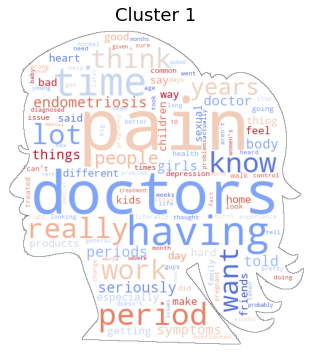

In [ ]:
wordcloud_kmedians_one(Xw_new, df_women, 5, 1, 'woman')

One of the clusters from the thread about women’s issues showed that women often felt that they were not being taken seriously by doctors. Often dismissed as simply period symptoms or emotional distress from hormones, some medical emergencies in women are often minimized in importance. There are also studies that have said that women waited longer in emergency rooms, and if they had stomach pain, they were made to wait 33% longer than men with similar symptoms [6].

It is situations like these that can leave women with a feeling that they are lesser than, that they are not a priority, that they are not as important in the eyes of society. It is quite understandable as to why this is a source of frustration.

> " *Medical conditions going untreated because they’re all dismissed as anxiety (the new hysteria) or related to hormones. 
A neurologist tried to tell me unexplained episodes of body numbness couldn't possibly be the migraines the ER doctors treated effectively, but must be anxiety.   I said that would be very unusual given that I had no anxiety before or during these episodes.* "

#### Women's Cluster 2: Reproductive Agency

**Figure 23: Women's Cluster 2: Reproductive Agency**

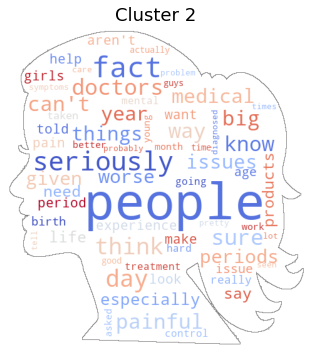

In [ ]:
wordcloud_kmedians_one(Xw_new, df_women, 5, 2, 'woman')

A cluster was also formed that showed that women often found themselves restricted in choice around their own reproductive rights. A wide array of choices for birth control and menstrual products are often not available to them, and are often very expensive. The “pink tax”, where products marketed for women are often more expensive even though they are the same quality product, is a thing that exists. A cursory check in the Watsons online shop, a popular healthcare and beauty care chain store, shows that Gillette Daisy, a 1-piece pink razor costs Php 48.00 [7], while Gillette Blue, a 2-pack pivot razor, costs Php 59.00 [8]. Per piece, the women’s razor is nearly twice as expensive.

The extra cost alone of having to purchase menstrual products monthly can weigh heavy on those who may not have as much in terms of money. And for women who have lost their homes and find themselves out on the streets, this is a problem they often have to solve creatively, as they do not have the means to meet these needs adequately.

> "*Period poverty.... when it comes down to it, pads and tampons are very expensive and there is a large number of people who have periods who can not afford them, and access to these essential items that people need to continue living their lives while they have their period is severely limited...*"

#### Women's Cluster 3: Contraceptives & Motherhood

**Figure 24: Women's Cluster 3: Contraceptives & Motherhood**

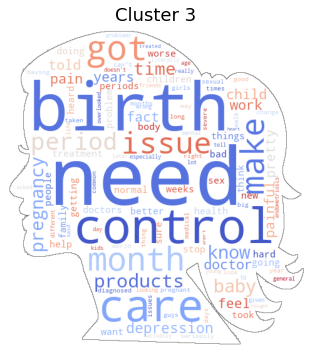

In [ ]:
wordcloud_kmedians_one(Xw_new, df_women, 5, 3, 'woman')

Another overlooked issue that came up in the clustering was the emotional effects of contraceptives and motherhood. A lot of women’s contraceptives involve playing around with the amount of hormones the body is exposed to, and often, these unusual changes wreak havoc on a woman’s emotional state. During pregnancy too, and even after, women are subject to huge hormonal fluctuations that can impact mood in a big way, so much so that after birth, mothers can become depressed.

Postpartum depression (PPD) affects as many as 10-15% of mothers, and can last as long as 6 months [9]. Emotional turmoil can be exacerbated by the fact that, often, people will put the health of the baby first over the mother’s. This can make the mother feel like they are reduced to just their reproductive organs and their ability to give birth, making them feel dehumanized.

> "*Throughout my pregnancy I wasn’t seen as a human being, I was seen as an incubator. Then when my baby was born I was completely ignored. I had five weeks of infection on my caesarean scar but my baby took priority in every medical appointment and my infection was missed. As a mother - I’m invisible.*"

#### Women's Cluster 4: Medical Issues (incl. Mental Health)

**Figure 25: Women's Cluster 4: Medical Issues (incl. Mental Health)**

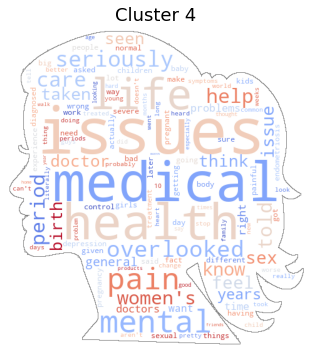

In [ ]:
wordcloud_kmedians_one(Xw_new, df_women, 5, 4, 'woman')

One other lesser known issue that affects women is the prevalence of the one-size-fits-all approach when it comes to health and medical issues. While most cases may be cases where symptoms for certain illnesses are common for both sexes, there are definitely common medical issues like heart disease that present themselves differently based on the patient’s sex. For a specific example, in heart attacks, while the most common symptom for both sexes is chest pain, women are more likely to experience other symptoms like shortness of breath, nausea/vomiting, and back or jaw pain.

In evidence-based medicine, most research has been done by men, and on men, leading to a big gap in understanding on how certain illnesses affect women. A gender bias exists in the medical world [10], and it has only been recently that people are taking notice. There is limited knowledge in this area, and it’s affecting women negatively.

> "*Very little medical research has been done on women, which is why so few women with autism or ADHD etc get diagnosed, but it also means we get given wrong doses of medications and painkillers are not as effective because they've all been tested on men.*"

#### Women's Cluster 5: Sexual Objectification

**Figure 26: Women's Cluster 5: Sexual Objectification**

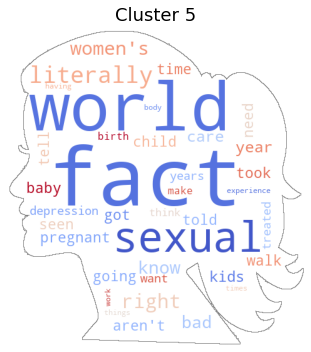

In [ ]:
wordcloud_kmedians_one(Xw_new, df_women, 5, 5, 'woman')

While it has been well established that women experience their fair share of sexual harassment, objectification, and discrimination, there are some aspects of these circumstances that does not get talked about enough. When these things happen to underaged girls, or to women in a culture where they don’t have a lot of rights, there is still a hesitation to shed light on these issues, not only because of how atrocious it can get, but also because there may be a feeling of distance between these things. An underlying and pervasive disposition of being complacent about how things are can exist, either because it’s too inconvenient and unpleasant to think about or it is happening too far from us. And yet it is in these areas where light is most needed, for the more it gets ignored, the more it is perpetuated.

An estimated 71% of the 20-40 million people in slavery are women [11], with 50,000 people being trafficked yearly into the United States alone, mostly from Mexico and the Philippines [12]. These numbers may be hard to read, but that makes it all the more important to spread the word about it.

> "*The fact that sexual harassment often starts before a girl is even an adult.
The fact that women grow up learning that their most important source of value is in their appearance, and other women also participate in reinforcing it.*"

In [ ]:
# Generate cluster wordclouds for men comments.
men_clusters, mmedians = wordcloud_kmedians(Xm_new, df_men, 5, 'man')

#### Men's Cluster 1: "Taking it like a Man"

**Figure 27: Men's Cluster 1: "Taking it Like a Man**

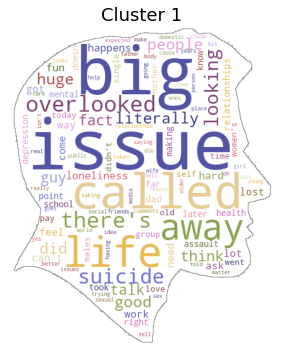

In [ ]:
wordcloud_kmedians_one(Xm_new, df_men, 5, 1, 'man')

The first cluster formed looks into the negative effects of the paradigm that men are in a position of privilege. Because of this, their issues become invalidated. If it is especially an issue that disproportionately affects men, then they are sometimes already labeled as an incel or a misogynist. This invalidation could therefore pressure men’s issues to be overlooked. 

Using the perspective related to privilege in this way can be harmful as not all men necessarily benefit from it. In fact, environments that promote toxic masculinity also create victims out of men. 

One such comment from this cluster says the following: 

> "*The fact that if you mention any issue that disproportionately affects men you are immediately identified as an incel/misogynist/MRA.*"




#### Men's Cluster 2: Don't Have Feelings

**Figure 28: Men's Cluster 2: Don't Have Feelings**

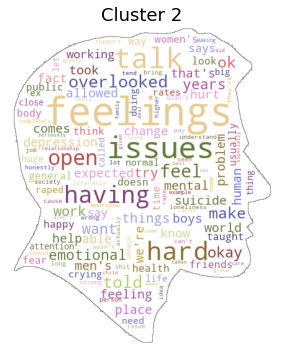

In [ ]:
wordcloud_kmedians_one(Xm_new, df_men, 5, 2, 'man')

The second cluster could be summarized into three words- boys don’t cry. This is very closely linked to the first cluster. As opposed to a lot of women’s issues, men’s issues do not get national priority. If this, alongside the environment that causes toxic aspects of masculinity to fester, could make men reluctant to internalize their problems, then perhaps it is why some men don’t share about their problems either.

The notion of purely toughing it out- that no one is willing to listen, is both archaic and counter-intuitive to humanity. The species was born to live and function in communities. To therefore box-in one-half of the planet to be nothing but punching bags for whatever life may throw their way can perpetuate a toxic cycle.

One such comment from this cluster says the following: 

> "*Crushing, black, empty, cold, never-ending, screaming-into-the-void loneliness and everyone's casual shrug when I even hint about it. Just work, pay taxes, walk the dog, keep your mouth shut, don't have feelings, don't be short, try to keep up appearances of virility, and never, ever, whatever you do, don't let anyone know how lonely you are because they'll just sort of awkwardly giggle and change the subject.*"

#### Men's Cluster 3: Double Standards

**Figure 29: Men's Cluster 3: Double Standards**

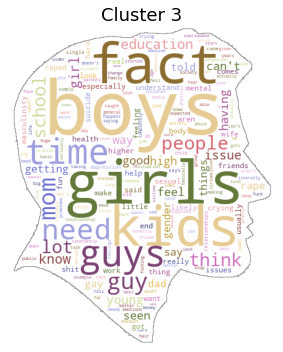

In [ ]:
wordcloud_kmedians_one(Xm_new, df_men, 5, 3, 'man')

This third cluster can be described as actions that both sexes do but can either figuratively emasculate men or have them seen in a malicious light, with how some in society perceive these actions. This is also linked to interests and inclinations that some men have that may traditionally be considered a more feminine role. While one sex may be more inclined to more nurturing roles from a biological perspective, it does not mean that the other should be judged for filling such a role.

This societal paradigm is that men commit about 97% of domestic abuse crimes [13]. While a lot of men are perpetrators, this begs the question as to whether or not they should be generally presumed as one. 




One such comment from this cluster says the following: 

> "*So I'm at the park playing tag with these kids I'm babysitting and out of nowhere this old lady comes up to me and starts asking all sorts of questions. Do you know these kids? What are there names? Can you call their parents for me? Even asking the kids if they knew me and when they answered yes, she responded with "you don't have to lie, if you don't know this man, you can tell me and I can help you.*"

#### Men's Cluster 4: Mental Health

**Figure 30: Men's Cluster 4: Mental Health**

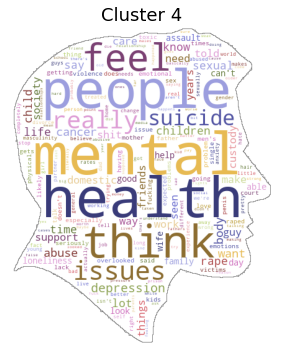

In [ ]:
wordcloud_kmedians_one(Xm_new, df_men, 5, 4, 'man')

Related to all the clusters mentioned thus far, this one looks at how men approach things that degrade their mental health. The way society reacts to male privilege, the environment that causes toxic masculinity to thrive, and the double-standards men are faced with all negatively impact male mental health, sometimes to the point of depression or even suicide. Even with friends, a sense of loneliness can be felt if deeper, more meaningful connections are not formed. While healthy outlets are available, a good support system seems to be lacking based on the comments that formed this cluster.

One such comment from this cluster says the following: 

> "*Loneliness. Many men tend to have a lot of friends, but never close friends or people they feel like truly care about them, which leads to declining mental health, and maybe worse.*"


#### Men's Cluster 5: Forced Circumcision

**Figure 31: Men's Cluster 5: Forced Circumcision**

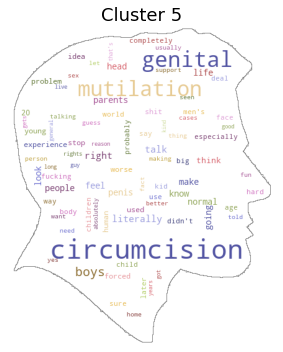

In [ ]:
wordcloud_kmedians_one(Xm_new, df_men, 5, 5, 'man')

This unique cluster looks into something that a lot of men don’t have control over, circumcision. It is often done when they are infants, showing a lack of choice in a decision about their body. If people are educated about the functionality of foreskin [14], then perhaps not all of them would agree to this practice.

One such comment from this cluster says the following: 

> "*Male genital mutilation aka circumcision. The foreskin has about 16,000-20,000 nerve endings and the head of the penis has 4,000. Circumcised boys lose about 70% of all penile sensation.*"


## 8 Conclusion and Recommendation

With data coming from two relatively high-traffic Reddit posts, the best clustering was found using K-Medians at k=5. The five meaningful clusters generated each for men and women revealed the following:
- **Women's issues** revolve around medical concerns and reproductive health and agency, and sexual objectification.
- **Men's issues**, on the other hand, revolved around around mental health, being unable to talk about feelings, double standards, and forced circumcision.

It feels like there is a push and pull going on between these unspoken issues that men and women face. In men, there is a pressure to not speak too openly about things that bother them, and this can mean that in circumstances when they do speak out, there is a great need to pay attention, and so, more weight is given to their words. Whereas with women, they are much more open about things that they are feeling and experiencing, and expressing these things are so common that sometimes they are minimized.

While there may not be much overlap between the issues for men and women, there can be seen a distinct pattern of both sides feeling unheard and unseen in different aspects. Concerns regarding mental and emotional health feature strongly in both sexes, and indicates a growing need to have these concerns addressed.

With appropriate cleaning, vectorization, clustering, and analysis, the study was able to take one step closer to understanding issues unique to men and women. The following recommendations and paths may be considered for future studies:

1. With the focus on the study being on cisgendered males and females, a similar study could be conducted for different members of the LGBTQIA+ community to understand their struggles better.
2. Another interesting direction to take would be to see how these issues have evolved over time- involving a potential time series analysis.
3. Considering other machine learning models including possibly neural networks and other deep learning models may aid in finding patterns to similar studies that build upon this foundation.
4. Partnering up with domain experts on feminism and men's rights may allow for different perspectives on the different clusters.
5. More qualitiative approaches such as focus group discussion may allow for a more intuitive understanding from even more perspectives.
6. Future studies can also include culture as a factor as a majority of the comments seem to come from a more western perspective. 


## 9 References

[1] Wikipedia, "AskReddit", retrieved from https://en.wikipedia.org/wiki/R/AskReddit

[2] Reddit, "AskReddit", retrieved from https://www.reddit.com/r/AskReddit/

[3] Auerbach, David (2015-07-06). "The Reddit Blackout Isn't About One Fired Employee. It's About a Dysfunctional Relationship at Reddit's Core". Slate. Retrieved 2020-07-30

[4] Jokic, Natasha (2020-02-15). "An insider's guide to Reddit's advice communities — where strangers solicit and give tips on everything from STDs to what to have for dinner". Insider. Retrieved 2020-07-30.

[5] Wong, Kevin (2018-11-21). "The Best AskReddit Threads of All Time". Complex. Retrieved 2020-07-30.

[6] Chen, Esther et al. (2008-03-29). “Gender Disparity in Analgesic Treatment of Emergency Department Patients with Acute Abdominal Pain”. Academic Emergency Medicine. https://onlinelibrary.wiley.com/doi/full/10.1111/j.1553-2712.2008.00100.x. Retrieved 2021-09-16.

[7] GILLETTE Daisy Plus 1 Razor. https://www.watsons.com.ph/daisy-plus-1-razor/p/BP_10001008. Retrieved 2021-09-16.

[8] GILLETTE Blue 2 Pivot Razor Blades Pack 2s. https://www.watsons.com.ph/blue-2-pivot-razor-blades-pack-2s/p/BP_10076285. Retrieved 2021-09-16.

[9] Anokye, Reindolf et al (2018-05-09). “Prevalence of postpartum depression and interventions utilized for its management”. Annals of General Psychiatry. https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5941764/. Retrieved 2021-09-16.

[10] Holdcroft, Anita (2007-01). “Gender bias in research: how does it affect evidence based medicine?”. Journal of the Royal Society of Medicine. https://www.ncbi.nlm.nih.gov/pmc/articles/PMC1761670/. Retrieved 2021-09-16.

[11] “Trafficking and Slavery Fact Sheet.” Free the Slaves. https://www.freetheslaves.net/wp-content/uploads/2018/04/Trafficking-ans-Slavery-Fact-Sheet-April-2018.pdf. Retrieved 2021-09-16.

[12] “Human Trafficking Within and Into The United States: A Review of the Literature.” Office of the Assistant Secretary for Planning and Evaluation. https://aspe.hhs.gov/report/human-trafficking-and-within-united-states-review-literature#Trafficking. Retrieved 2021-09-16.

[13] Office for the prevention of domestic violence. Understanding Domestic Abusers: Gender and Intimate Partner Violence - Gender and domestic abuse - NYS OPDV. (n.d.). Retrieved September 15, 2021, from https://opdv.ny.gov/professionals/abusers/genderandipv.html. 

[14] Bossio, J. A., Jennifer A. Bossio  Department of Psychology, Pukall, C. F., Caroline F. Pukall  Department of Psychology, Steele, S. S., Stephen S. Steele  Department of Urology, &amp; Information, V. A. A. (2015). Examining penile sensitivity in neonatally circumcised and intact men using quantitative sensory testing. Journal of Urology. Retrieved September 15, 2021, from https://www.auajournals.org/doi/pdf/10.1016/j.juro.2015.12.080. 

## 10 Acknowledgements

- Prof. Christian Alis, for imparting to his students the fundamentals and application of Data Mining and Wrangling.
- Leo Lorenzo II, for always being available to his mentees for questions and consultations.
- Prof. Sebastian Ibanez, for introducing his students to the fundamentals of SVD.